In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mplcol
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import ScalarFormatter
import pandas as pd
import mpl_scatter_density

from astropy.io import fits, ascii
from astropy.table import Table,vstack
import astropy.units as u
import astropy.coordinates as coord
from astropy.coordinates import ICRS,SkyCoord

from dustmaps.gaia_tge import GaiaTGEQuery
from zero_point import zpt

from scipy.stats import norm
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter
from sklearn.neighbors import KernelDensity
from sklearn.preprocessing import StandardScaler
%matplotlib inline

# define colormap for all the density plots
white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#440053'),
    (0.2, '#404388'),
    (0.4, '#2a788e'),
    (0.6, '#21a784'),
    (0.8, '#78d151'),
    (1, '#fde624'),
], N=256)

## Preparing the target catalogue

In [2]:
# # DONE ONLY ONCE TO CREATE TARGET CATALOGUE, DO NOT UNCOMMENT!!
# path='data/catalogues/testtt.fits'
# hdu_list = fits.open(path, memmap=True)
# data = Table(hdu_list[1].data)

# parallax=data['parallax']
# parallax_e=data['parallax_error']
# phot_dist=data['distance_gspphot']
# Gmag=data['phot_g_mean_mag']
# BP0=data['BP_0']
# RP0=data['RP_0']
# bprp0=BP0-RP0
# bprp=data['phot_bp_mean_mag']-data['phot_rp_mean_mag']
# nu_eff=data['nu_eff_used_in_astrometry']
# pseudocolour=data['pseudocolour']
# ecl_lat=data['ecl_lat']
# astr_par_sol=data['astrometric_params_solved']

# # use the script by Lindegren et al. (2021) to compute zero-points
# from zero_point import zpt

# zpt.load_tables()
# valid = astr_par_sol > 3
# zp=np.empty(shape=len(Gmag))
# zp[valid] = zpt.get_zpt(Gmag[valid], nu_eff[valid], pseudocolour[valid], ecl_lat[valid], astr_par_sol[valid],_warnings=False)
# zp[valid==False] = 0

# # check the number of objects with astrometric_params_solved not 31 or 95 degree
# print('The number of targets with astrometric_params_solved = 3 is',np.size(Gmag[valid==False]))
# print('The number of targets with nu_eff_used_in_astrometry outside of the range [1.1,1.9] is',np.size(nu_eff[nu_eff < 1.1])+np.size(nu_eff[nu_eff > 1.9]))

# parallax0 = parallax - zp

# no_paral=(np.isnan(parallax0)==True)
# no_distph = (np.isnan(phot_dist)==True)
# paral_bet3 = (parallax0 >= 3*parallax_e)
# paral_wor3 = (parallax0 < 3*parallax_e)

# # compute absolute magnitudes
# M_G = np.empty(shape=(len(Gmag)))
# M_G[paral_bet3] = Gmag[paral_bet3] + 5 + 5*np.log10(parallax0[paral_bet3]/1000)
# M_G[no_paral] = np.nan
# M_G[paral_wor3] = np.nan
# M_G[paral_wor3] = Gmag[paral_wor3] + 5 - 5*np.log10(phot_dist[paral_wor3])

# data=data[np.logical_or((bprp0<1.1),(bprp0>1.1) & (M_G<3.5))]

# data.write('data/output.csv',delimiter=',',format='ascii')

# 4.1. Colour-magnitude diagrams

In [3]:
# enter path of table to be used:
# for now enter the table I downloaded from Gaia, as 4MOST input catalogue does not contain all parameters yet
path='data/4MOST_S2_target_catalogue.fits'
hdu_list = fits.open(path, memmap=True)
evt_data = Table(hdu_list[1].data)
hdu_list.close()
print('The number of all objects in this catalogue is',len(evt_data))
print('The number of objects in the bright survey is',len(evt_data[evt_data['phot_g_mean_mag']<=14.5]))
print('The number of objects in the faint survey is',len(evt_data[(evt_data['phot_g_mean_mag']<=15.5) & (evt_data['phot_g_mean_mag']>14.5)]))
print('The number of objects in the deep survey is',len(evt_data[evt_data['phot_g_mean_mag']>15.5]))
print('The number of all objects (dec<5°) in this catalogue is',len(evt_data[evt_data['dec']<5]))
print('The number of objects (dec<5°) in the bright survey is',len(evt_data[(evt_data['phot_g_mean_mag']<=14.5) & (evt_data['dec']<5)]))
print('The number of objects (dec<5°) in the faint survey is',len(evt_data[(evt_data['phot_g_mean_mag']<=15.5) & (evt_data['phot_g_mean_mag']>14.5) & (evt_data['dec']<5)]))
print('The number of objects (dec<5°) in the deep survey is',len(evt_data[(evt_data['phot_g_mean_mag']>15.5) & (evt_data['dec']<5)]))
evt_data

The number of all objects in this catalogue is 4591150
The number of objects in the bright survey is 916582
The number of objects in the faint survey is 1163606
The number of objects in the deep survey is 2510962
The number of all objects (dec<5°) in this catalogue is 3809536
The number of objects (dec<5°) in the bright survey is 751312
The number of objects (dec<5°) in the faint survey is 961530
The number of objects (dec<5°) in the deep survey is 2096694


source_id,E(B-V),G_0,d_G,BP_0,d_BP,RP_0,d_RP,CaHK_0,d_CaHK,FeH_CaHKsyn,FeH_CaHKsyn_16th,FeH_CaHKsyn_50th,FeH_CaHKsyn_84th,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,l,b,astrometric_params_solved,nu_eff_used_in_astrometry,pseudocolour,phot_bp_rp_excess_factor,ruwe,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,ecl_lat,teff_gspphot,logg_gspphot,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int16,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
10010404831703168,0.26090074,13.655340186964867,0.002772,14.137126437612316,0.003075,13.01855495245925,0.003876,15.808328965219147,0.069389,-0.532547337809608,-0.8564504747111542,-0.5301356131887514,-0.27849986626469037,51.87073738804167,0.01724880188703537,7.385781568481823,0.016400713473558426,0.26289193363300495,0.019752901047468185,-1.2826435437527337,0.024207476526498795,-2.779160441600775,0.021311350166797638,23.300792694091797,3.029458999633789,176.20387395918078,-38.84284798284498,31,1.4345462322235107,nan,1.2582416534423828,1.0273830890655518,14.212384223937988,14.857087135314941,13.439505577087402,-11.090622010351765,5319.0361328125,3.3046998977661133,2069.725341796875,1933.2384033203125,2227.5107421875
10003739042447232,0.21067981,13.93993030389311,0.002774,14.194134048465894,0.00335,13.52397634178086,0.003946,14.94069974831629,0.027947,-0.5790639852550328,-0.7579417519726813,-0.5912296714758178,-0.45795983428241244,52.280239411026464,0.021216075867414474,7.454817136783638,0.017376240342855453,0.7750083801370573,0.024232756346464157,3.242664733287083,0.02365376055240631,0.3392819499440748,0.020213020965456963,16.85465431213379,11.037229537963867,176.5007041312522,-38.5023247670994,31,1.532737374305725,nan,1.2139828205108643,1.0096454620361328,14.42115592956543,14.7981595993042,13.866596221923828,-11.12493636138408,6366.8212890625,4.092599868774414,1229.7364501953125,1198.0263671875,1262.657958984375
10003842121661568,0.20856458,15.241354905823382,0.002796,15.56644057418106,0.006184,14.755379048061378,0.004426,16.57313124049325,0.082809,-0.5289810943038117,-0.875151602864346,-0.5453907045650868,-0.20981246768164472,52.28841485778363,0.037372395396232605,7.458997592708229,0.030474087223410606,0.49310751904379313,0.040632981806993484,1.2366923919366637,0.042916398495435715,0.8746031095648672,0.03596721589565277,nan,nan,176.50401108076284,-38.49357890918244,31,1.5003904104232788,nan,1.2208865880966187,0.9965779185295105,15.708529472351074,16.15779685974121,15.093904495239258,-11.122896836055414,5199.04736328125,4.303299903869629,1286.7734375,1241.955322265625,1351.2906494140625
10016589584558336,0.24166569,15.35979913037939,0.002799,15.672941121000186,0.003726,14.879402730292085,0.005308,16.646105145489994,0.093913,-0.5442465686021756,-0.9375477274356667,-0.5072017945074101,-0.25987069905609333,51.86989259179188,0.03472014144062996,7.5068078329629815,0.032591626048088074,0.7661287407495992,0.04194869101047516,11.589076511069031,0.04435095191001892,-7.730914790413298,0.038305457681417465,nan,nan,176.09149213107492,-38.75931691069964,31,1.5002641677856445,nan,1.2273999452590942,0.9522027373313904,15.900846481323242,16.358280181884766,15.271522521972656,-10.97323637842063,5701.11767578125,4.557199954986572,954.5742797851562,903.19482421875,1032.298828125
10021468667440384,0.18873742,14.014398302828027,0.002769,14.325824283791025,0.003569,13.533330543509871,0.003937,15.325317877985295,0.044636,-0.4445167076129895,-0.6080132108689899,-0.4332280368871605,-0.30006689556596117,52.1198892997033,0.020198006182909012,7.616975821882621,0.01696321740746498,1.4140374889248821,0.023076364770531654,9.299061750804878,0.02629635855

In [4]:
evt_data = evt_data[(evt_data['dec'] <= 5)]  # only for dec < 5°

source_id = evt_data['source_id']
ra = evt_data['ra'] # in deg
dec = evt_data['dec'] # in deg
parallax = evt_data['parallax'] # in mas
parallax_e = evt_data['parallax_error'] # in mas
parallax_e_bes = parallax_e
Gmag = evt_data['phot_g_mean_mag'] # in mag
Gmag_bes = Gmag
BP = evt_data['phot_bp_mean_mag'] # in mag
RP = evt_data['phot_rp_mean_mag'] # in mag
bprp = BP-RP # in mag
BP0 = evt_data['BP_0'] # in mag
RP0 = evt_data['RP_0'] # in mag
bprp0 = BP0-RP0 # in mag
lat = evt_data['b']
lon = evt_data['l']
phot_dist = evt_data['distance_gspphot'] # in pc
phot_dist_lower=evt_data['distance_gspphot_lower'] # in pc
phot_dist_upper=evt_data['distance_gspphot_upper'] # in pc
phot_dist_e=(phot_dist_upper-phot_dist_lower)/2 # in pc
fe_h = evt_data['FeH_CaHKsyn']
fe_h_bes = fe_h
astr_par_sol = evt_data['astrometric_params_solved']
nu_eff = evt_data['nu_eff_used_in_astrometry']
ecl_lat = evt_data['ecl_lat']
pseudocolour = evt_data['pseudocolour']

# use the script by Lindegren et al. (2021) to compute zero-points of the parallax
zpt.load_tables()
valid = astr_par_sol > 3
zp=np.empty(shape=len(Gmag))
zp[valid] = zpt.get_zpt(Gmag[valid], nu_eff[valid], pseudocolour[valid], ecl_lat[valid], astr_par_sol[valid],_warnings=False)
zp[valid==False] = 0

# check the number of objects with astrometric_params_solved not 31 or 95 degree
print('The number of targets with astrometric_params_solved = 3 is',np.size(Gmag[valid==False]))
print('The number of targets with nu_eff_used_in_astrometry outside of the range [1.1,1.9] is',np.size(nu_eff[nu_eff < 1.1])+np.size(nu_eff[nu_eff > 1.9]))

# new parallaxes
parallax0 = parallax - zp
parallax0_bes = parallax0

evt_data=[] # free up RAM space

The number of targets with astrometric_params_solved = 3 is 25046
The number of targets with nu_eff_used_in_astrometry outside of the range [1.1,1.9] is 2


The number of all objects in this analysis is 3809536
The number of objects in the bright survey is 751312
The number of objects in the faint survey is 961530
The number of objects in the deep survey is 2096694

The number of objects where parallax => 3*parallax_error is 3598669
Bright survey: 727841; Faint survey: 925698; Deep survey: 1945130
This is 94.46% (96.88%, 96.27%, 92.77%)

If I decide to use photometric distance when parallax < 3*parallax_error, I ask that phot_dist>10*phot_dist_error:
Additional 143683 objects are available
In this case the total percentage is 98.24%


/home/jens/anaconda3/lib/python3.9/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/home/jens/anaconda3/lib/python3.9/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


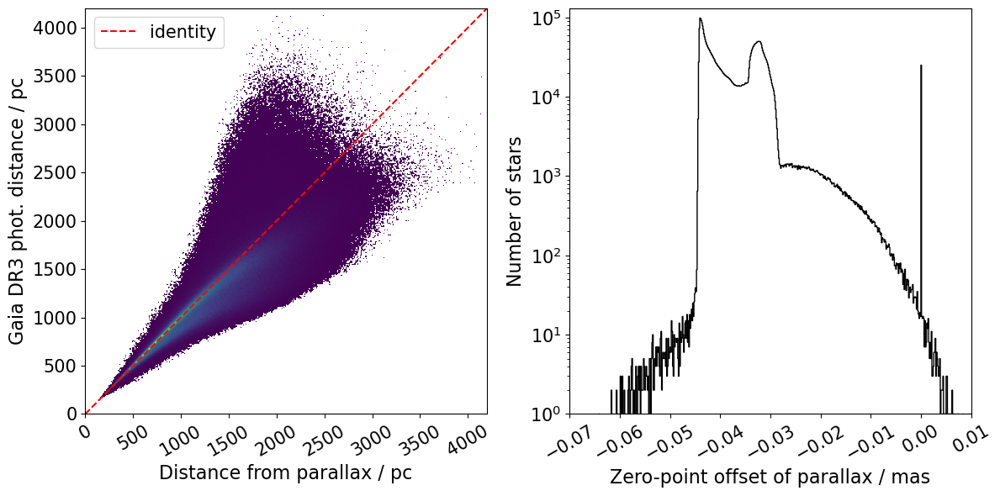

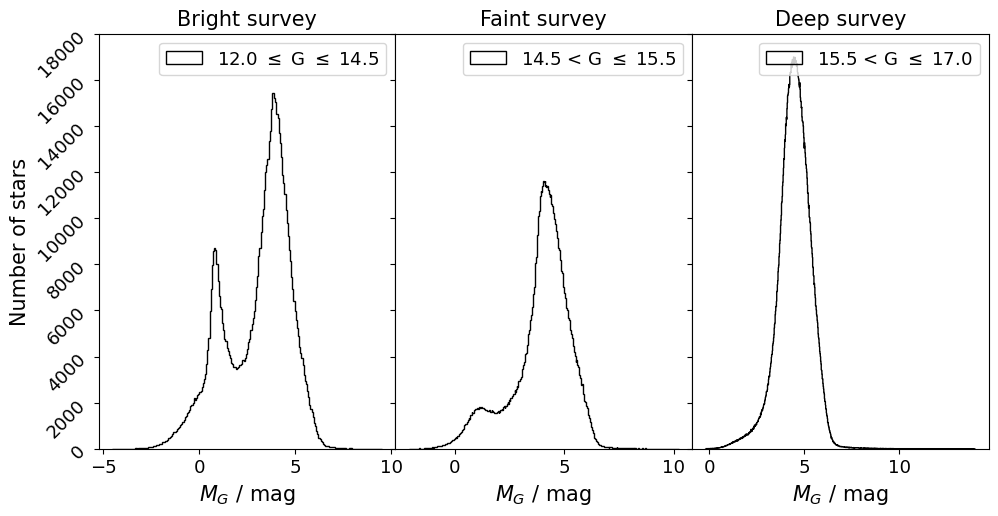

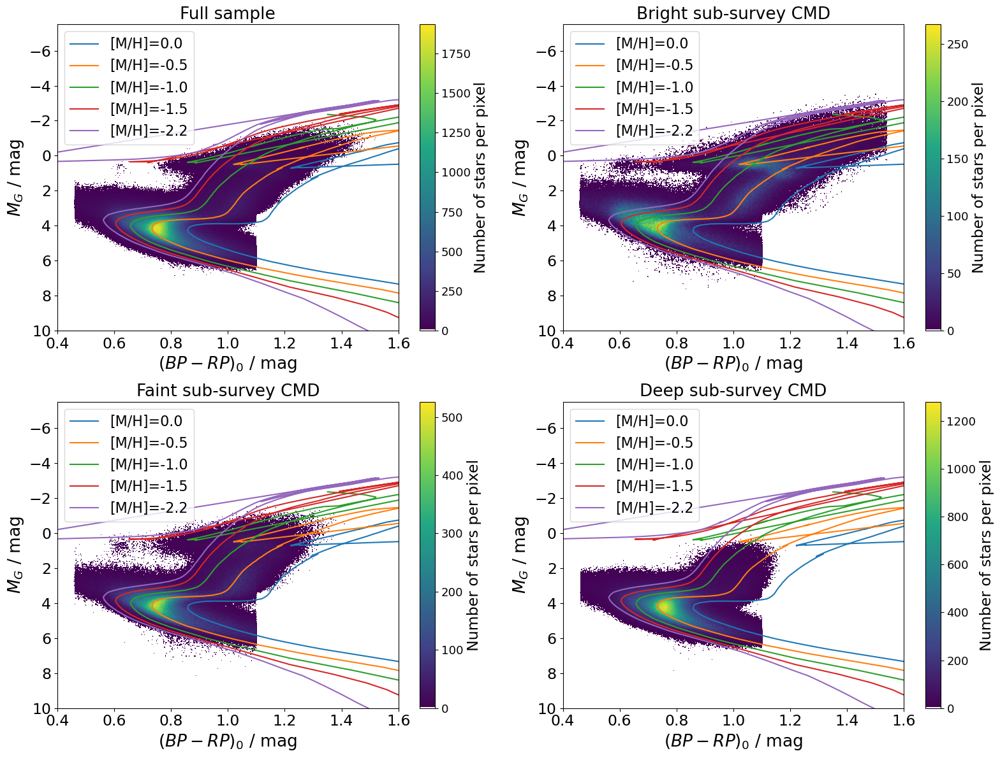

In [5]:
# define conditions for better readability
bright = (Gmag<=14.5)
faint = (Gmag>14.5) & (Gmag<=15.5)
deepall = (Gmag>15.5)
no_paral=(np.isnan(parallax0)==True)
no_distph = (np.isnan(phot_dist)==True)
paral_bet3 = (parallax0 >= 3*parallax_e)
paral_wor3 = (parallax0 < 3*parallax_e)

# compute absolute magnitudes only via parallax for paral_bet3
M_G = np.empty(shape=(len(source_id)))
M_G[paral_bet3] = Gmag[paral_bet3] + 5 + 5*np.log10(parallax0[paral_bet3]/1000)
M_G[no_paral] = np.nan
M_G[paral_wor3] = np.nan
#M_G[paral_wor3 & (phot_dist>10*phot_dist_e)] = Gmag[paral_wor3 & (phot_dist>10*phot_dist_e)] + 5 - 5*np.log10(phot_dist[paral_wor3 & (phot_dist>10*phot_dist_e)])

# calculate the G band extinctions from Gaia TGE dust map
coords = coord.SkyCoord(lon*u.deg, lat*u.deg, frame='galactic')
tge = GaiaTGEQuery()
A0 = np.empty(shape=len(source_id))
A0[0:int(len(source_id)-len(source_id[np.isnan(lon)==True]))] = tge(coords[0:int(len(source_id)-len(source_id[np.isnan(lon)==True]))])
A0[int(len(source_id)-len(source_id[np.isnan(lon)==True])):len(source_id)] = np.nan

# G band
A_G=np.empty(shape=(len(A0)))

# using BP-RP for MS
a1=0.995969721536602
a2=-0.159726460302015
a3=0.0122380738156057
a4=0.00090726555099859
a5=-0.0377160263914123
a6=0.00151347495244888
a7=-2.52364537395142e-05
a8=0.0114522658102451
a9=-0.000936914989014318
a10=-0.000260296774134201
X = bprp0[(M_G>5)==True]/5040
k_G = a1+a2*X+a3*X**2+a4*X**3+a5*A0[(M_G>5)==True]+a6*A0[(M_G>5)==True]**2+a7*A0[(M_G>5)==True]**3+a8*A0[(M_G>5)==True]*X+a9*A0[(M_G>5)==True]*X**2+a10*X*A0[(M_G>5)==True]**2
A_G[(M_G>5)] = k_G*A0[(M_G>5)]

# using BP-RP for HRD top
a1=0.996727636184546
a2=-0.161532912039159
a3=0.0121894634053956
a4=0.00108655443373807
a5=-0.0378418720324357
a6=0.00150218619071414
a7=-2.43558666819941e-05
a8=0.0119452762544019
a9=-0.000900410348061063
a10=-0.000285148019567325
X = bprp0[(M_G>5)==False]/5040
k_G = a1+a2*X+a3*X**2+a4*X**3+a5*A0[(M_G>5)==False]+a6*A0[(M_G>5)==False]**2+a7*A0[(M_G>5)==False]**3+a8*A0[(M_G>5)==False]*X+a9*A0[(M_G>5)==False]*X**2+a10*X*A0[(M_G>5)==False]**2
A_G[(M_G>5)==False] = k_G*A0[(M_G>5)==False]

M_G0 = M_G-A_G

# just some statistics regarding the parameters
print('The number of all objects in this analysis is',len(source_id))
print('The number of objects in the bright survey is',len(source_id[bright]))
print('The number of objects in the faint survey is',len(source_id[faint]))
print('The number of objects in the deep survey is',len(source_id[deepall]))
print('\nThe number of objects where parallax => 3*parallax_error is',len(source_id[paral_bet3]))
print('Bright survey: '+str(len(source_id[bright & paral_bet3]))+'; Faint survey: '+str(len(source_id[faint & paral_bet3]))+'; Deep survey: '+str(len(source_id[deepall & paral_bet3])))
print('This is '+str(round(len(source_id[paral_bet3])/len(source_id)*100,2))+'% ('+str(round(len(source_id[bright & paral_bet3])/len(source_id[bright])*100,2))+'%, '+str(round(len(source_id[faint & paral_bet3])/len(source_id[faint])*100,2))+'%, '+str(round(len(source_id[deepall & paral_bet3])/len(source_id[deepall])*100,2))+'%)')
print('\nIf I decide to use photometric distance when parallax < 3*parallax_error, I ask that phot_dist>10*phot_dist_error:')
print('Additional '+str(len(source_id[paral_wor3 & (phot_dist>10*phot_dist_e)]))+' objects are available')
print('In this case the total percentage is '+str(round((len(source_id[paral_bet3])+len(source_id[paral_wor3 & (phot_dist>10*phot_dist_e)]))/len(source_id)*100,2))+'%')

# compare photometric and parallax distances for objects with very small relative errors
distpa = np.empty(shape=(len(source_id)))
distpa[(parallax0 >= 10*parallax_e)] = 1000/parallax0[(parallax0 >= 10*parallax_e)]
distpa[no_paral] = np.nan
distpa[(parallax0 < 10*parallax_e)] = np.nan
distph = np.empty(shape=(len(source_id)))
distph[(phot_dist>=10*phot_dist_e)] = phot_dist[(phot_dist>=10*phot_dist_e)]
distph[no_distph] = np.nan
distph[(phot_dist<10*phot_dist_e)] = np.nan

nanrem=((np.isnan(distph)==False) & (np.isnan(distpa)==False))

# Gaia DR3 parallax vs. phot. distance (low errors)
dd=plt.figure(figsize=(12,6))
ax = dd.add_subplot(1, 2, 1, projection='scatter_density')
density = ax.scatter_density(distpa[nanrem],distph[nanrem],cmap=white_viridis)
plt.plot(np.linspace(0,5000,100),np.linspace(0,5000,100),color='r',ls='dashed',label='identity')
plt.xlim(0,4200)
plt.ylim(0,4200)
plt.xticks(size=15)
plt.yticks(size=15)
plt.xlabel('Distance from parallax / pc',size=16)
plt.ylabel('Gaia DR3 phot. distance / pc',size=16)
plt.legend(fontsize=15)
plt.tick_params(axis='x',labelrotation=30)
ax = dd.add_subplot(1, 2, 2, projection='scatter_density')
plt.hist(zp,bins='auto',histtype='step', stacked=True, fill=False,color='black')
plt.xlabel('Zero-point offset of parallax / mas',size=16)
plt.ylabel('Number of stars',size=16)
plt.yscale('log')
plt.xlim(-0.07,0.01)
plt.ylim(1,1.3*10**5)
plt.xticks(size=15)
plt.yticks(size=15)
plt.tick_params(axis='x',labelrotation=30)
plt.tight_layout()
plt.savefig('figures/4_01_dist_zp.png',format='png')

# histograms of absolute magnitudes
fig,axs = plt.subplots(nrows=1,ncols=3,figsize=(10,5),sharey=True)
axs[0].hist(M_G[bright],bins='auto',label='12.0 $\leq$ G $\leq$ 14.5',histtype='step', stacked=True, fill=False,color='black')
axs[0].set_xlabel('$M_G$ / mag',size=15)
axs[0].set_ylabel('Number of stars',size=15)
axs[0].set_title('Bright survey',size=15)
axs[0].legend(fontsize=13)
axs[0].tick_params(axis='both',labelsize=13)
axs[0].tick_params(axis='y',labelrotation=45)
axs[1].hist(M_G[faint],bins='auto',label='14.5 < G $\leq$ 15.5',histtype='step', stacked=True, fill=False,color='black')
axs[1].set_xlabel('$M_G$ / mag',size=15)
axs[1].set_title('Faint survey',size=15)
axs[1].legend(fontsize=13)
axs[1].tick_params(axis='x',labelsize=13)
axs[2].hist(M_G[deepall],bins='auto',label='15.5 < G $\leq$ 17.0',histtype='step', stacked=True, fill=False,color='black')
axs[2].set_xlabel('$M_G$ / mag',size=15)
axs[2].set_title('Deep survey',size=15)
axs[2].set_ylim(0,18000)
axs[2].legend(fontsize=13)
axs[2].tick_params(axis='x',labelsize=13)
plt.subplots_adjust(wspace=0,left=0.1,right=0.99,top=0.95,bottom=0.12)
plt.savefig('figures/4_02b_abs_magn_hist.png',format='png')

# Colour-magnitude diagrams of input catalogue, dereddened
# load isochrones and then plot everything
# plot with density of scatter plot because otherwise looks bad
iso0 = np.transpose(np.genfromtxt('data/isochrones/isochrone_age_12_mh_0.dat',skip_header=14,skip_footer=1))
iso1 = np.transpose(np.genfromtxt('data/isochrones/isochrone_age_12_mh_min0_5.dat',skip_header=14,skip_footer=1))
iso2 = np.transpose(np.genfromtxt('data/isochrones/isochrone_age_12_mh_min1.dat',skip_header=14,skip_footer=1))
iso3 = np.transpose(np.genfromtxt('data/isochrones/isochrone_age_12_mh_min1_5.dat',skip_header=14,skip_footer=1))
iso4 = np.transpose(np.genfromtxt('data/isochrones/isochrone_age_12_mh_min2_2.dat',skip_header=14,skip_footer=1))

def plot_cmd(cmd,pos,colour,M_G,subs,colstr):
    ax = cmd.add_subplot(2, 2, pos, projection='scatter_density')
    density = ax.scatter_density(colour, M_G, cmap=white_viridis)    
    cb=cmd.colorbar(density)
    cb.set_label(label='Number of stars per pixel',size=17)
    cb.ax.tick_params(labelsize=13)
    plt.plot(iso0[29]-iso0[30],iso0[28],label='[M/H]=0.0')
    plt.plot(iso1[29]-iso1[30],iso1[28],label='[M/H]=-0.5')
    plt.plot(iso2[29]-iso2[30],iso2[28],label='[M/H]=-1.0')
    plt.plot(iso3[29]-iso3[30],iso3[28],label='[M/H]=-1.5')
    plt.plot(iso4[29]-iso4[30],iso4[28],label='[M/H]=-2.2')
    plt.xlim(0.4,1.6)
    plt.ylim(10,-7.5)
    plt.xticks(size=17)
    plt.yticks(size=17)
    plt.xlabel(colstr+' / mag',size=19)
    plt.ylabel('$M_G$ / mag',size=19)
    plt.title(subs,size=19)
    plt.legend(fontsize=16)
    plt.tight_layout()

nan_bprp0_MG = (np.isnan(bprp0)==False) & (np.isnan(M_G0)==False)

cmd_redd=plt.figure(figsize=(16,12))
plot_cmd(cmd_redd,1,bprp0[nan_bprp0_MG],M_G0[nan_bprp0_MG],'Full sample','$(BP-RP)_0$')
plot_cmd(cmd_redd,2,bprp0[bright & nan_bprp0_MG],M_G0[bright & nan_bprp0_MG],'Bright sub-survey CMD','$(BP-RP)_0$')
plot_cmd(cmd_redd,3,bprp0[faint & nan_bprp0_MG],M_G0[faint & nan_bprp0_MG],'Faint sub-survey CMD','$(BP-RP)_0$')
plot_cmd(cmd_redd,4,bprp0[deepall & nan_bprp0_MG],M_G0[deepall & nan_bprp0_MG],'Deep sub-survey CMD','$(BP-RP)_0$')
plt.savefig('figures/4_02a_cmds_full.png',format='png')

# 4.2. Verification of [Fe/H] with GALAH, SAGA, etc.

In [6]:
### DON'T UNCOMMENT ###
### SAGA table needs some preparation for topcat
#t=pd.read_csv('data/txt_table_recommended.tsv',sep='\t',low_memory=False)
#tab = Table.from_pandas(t)
#tab.write('data/SAGA_modified.csv',delimiter=',',format='ascii')
#tab

# go back to using all 4.6 million objects
path='data/4MOST_S2_metallicity_verification.fits'
hdul = fits.open(path, memmap=True)
data_ver = Table(hdul[1].data)
hdul.close()
data_ver

source_id,FeH_CaHKsyn,FeH_CaHKsyn_16th,FeH_CaHKsyn_84th,ra,dec,l,b,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,flag_sp,teff,fe_h,flag_fe_h,alpha_fe,flag_alpha_fe,C_fe,flag_C_fe,Ca_fe,Ba_fe,flag_Ba_fe,Eu_fe,flag_Eu_fe,Separation_GALAH,[M/H],[C/H],[Fe/H],Separation_SAGA,STARFLAG,M_H_APOGEE,Separation_APOGEE,mh_xgboost_full,mh_xgboost_rgb,c_pred
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float32,float32,int64,float64,int64,float64,int64,float64,float64,int64,float64,int64,float64,float32,float32,float32,float64,int64,float32,float64,float32,float64,float32
10010404831703168,-0.532547337809608,-0.8564504747111542,-0.27849986626469037,51.87073738804167,7.385781568481823,176.20387395918078,-38.84284798284498,14.212384223937988,14.857087135314941,13.439505577087402,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.554,-0.554,nan
10003739042447232,-0.5790639852550328,-0.7579417519726813,-0.45795983428241244,52.280239411026464,7.454817136783638,176.5007041312522,-38.5023247670994,14.42115592956543,14.7981595993042,13.866596221923828,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.261,nan,nan
10003842121661568,-0.5289810943038117,-0.875151602864346,-0.20981246768164472,52.28841485778363,7.458997592708229,176.50401108076284,-38.49357890918244,15.708529472351074,16.15779685974121,15.093904495239258,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.343,nan,nan
10016589584558336,-0.5442465686021756,-0.9375477274356667,-0.25987069905609333,51.86989259179188,7.5068078329629815,176.09149213107492,-38.75931691069964,15.900846481323242,16.358280181884766,15.271522521972656,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.989,nan,nan
10021468667440384,-0.4445167076129895,-0.6080132108689899,-0.30006689556596117,52.1198892997033,7.616975821882621,176.2105461309445,-38.50455485178691,14.438813209533691,14.861766815185547,13.839944839477539,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.364,nan,nan
1004202009188352,-0.6445037069714813,-0.8097248906282638,-0.5067581411948231,46.15924689297299,2.6132294365595676,175.40183226122673,-46.2444567520686,14.58080005645752,14.989568710327148,14.0015287399292,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.654,nan,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9978312835804160,-0.5343627874466136,-0.7993024203831479,-0.2646226495207045,51.216562477924654,7.498006661987379,175.5175406560202,-39.22905814573005,15.739444732666016,16.185420989990234,15.123055458068848,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,-9223372036854775808,nan,-9223372036854775808,nan,nan,nan,nan,nan,-9223372036854775808,nan,nan,-0.728,nan,nan
999185487423744,-0.8485364261003646,-1.1060652444547356,-0.6718614936022005,46.51519006826394,2.680681882003293,175.69510714505614,-45.94510151566437,15.638413429260254,15.988762855529785,15.108865737915039,-9223372036854775808,nan,nan,-9223372036854775808,nan,

In [7]:
# input table
feh = data_ver['FeH_CaHKsyn']
feh16 = data_ver['FeH_CaHKsyn_16th']
feh84 = data_ver['FeH_CaHKsyn_84th']
Gmag = data_ver['phot_g_mean_mag']
BP = data_ver['phot_bp_mean_mag']
RP = data_ver['phot_rp_mean_mag']
bprp = BP - RP
l = data_ver['l']
b = data_ver['b']

# GALAH
feh_g = data_ver['fe_h']
feh_g_flag = data_ver['flag_fe_h']
alphafe_g = data_ver['alpha_fe']
alphafe_g_flag = data_ver['flag_alpha_fe']
c_fe = data_ver['C_fe']
c_fe_flag = data_ver['flag_C_fe']
ca_fe = data_ver['Ca_fe']
eu_fe = data_ver['Eu_fe']
eu_fe_flag = data_ver['flag_Eu_fe']
ba_fe = data_ver['Ba_fe']
ba_fe_flag = data_ver['flag_Ba_fe']
teff_g = data_ver['teff']
sep_g = data_ver['Separation_GALAH']
flag_sp=data_ver['flag_sp']
clean_none=np.array([True]*len(flag_sp))
clean_flags=(flag_sp==0)

# SAGA
feh_s = data_ver['[Fe/H]']
mh_s = data_ver['[M/H]']
c_h_s = data_ver['[C/H]']
sep_s = data_ver['Separation_SAGA']

# data-driven metallicities
mh_xgboost_full = data_ver['mh_xgboost_full']
mh_xgboost_rgb = data_ver['mh_xgboost_rgb']

# APOGEE
mh_a = data_ver['M_H_APOGEE']
sep_a = data_ver['Separation_APOGEE']
apogee_flag=data_ver['STARFLAG']
clean_flags_apo=(apogee_flag==0)

# Lucey et al. (2023) C-enhancement predictions
c_pred = data_ver['c_pred']

data_ver=[]

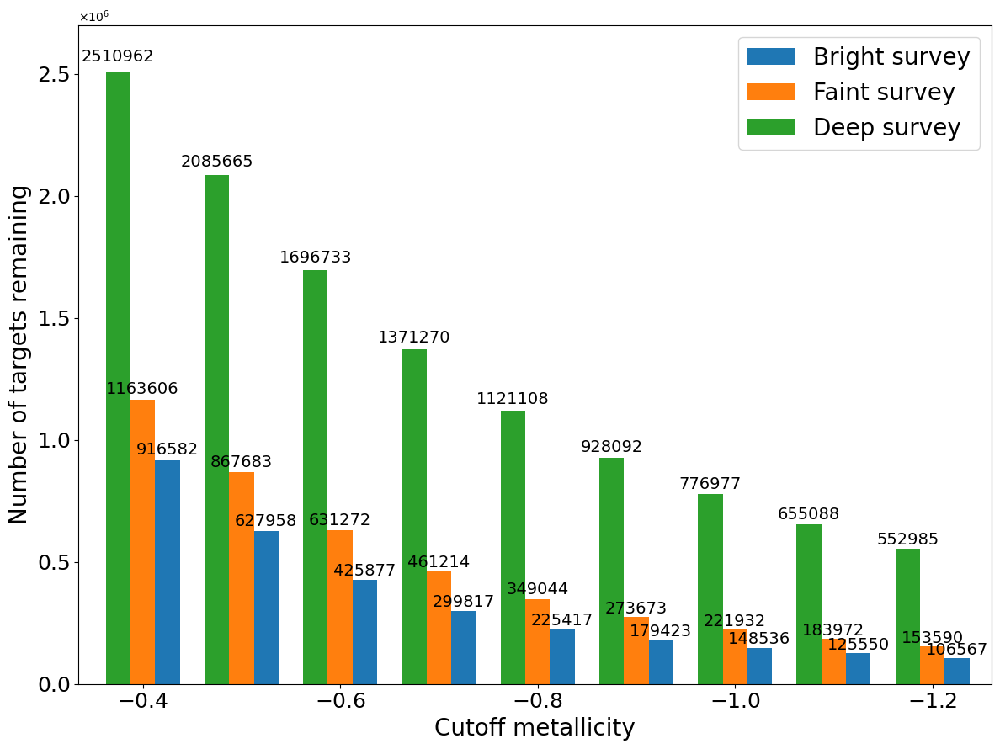

In [8]:
# check how many objects are in each sub-survey for more and more strict metallicity cuts
bright = (Gmag<=14.5)
faint = (Gmag>14.5) & (Gmag<=15.5)
deepall = (Gmag>15.5)

met=np.linspace(-0.4,-1.2,9)
n_br = np.array([])
n_fa = np.array([])
n_de = np.array([])

for i in met:
    n_br = np.append(n_br,len(feh[bright & (feh < i)]))
    n_fa = np.append(n_fa,len(feh[faint & (feh < i)]))
    n_de = np.append(n_de,len(feh[deepall & (feh < i)]))

plt.figure(figsize=(12,9))
ax = plt.subplot(111)
b1=plt.bar(met-0.025,n_br,width=0.025,label='Bright survey')
b2=plt.bar(met,n_fa,width=0.025,label='Faint survey')
b3=plt.bar(met+0.025,n_de,width=0.025,label='Deep survey')
for rect in b1:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2., 1.01*height,'%.0f' % float(height),ha='center', va='bottom',size=14)
for rect in b2:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2., 1.01*height,'%.0f' % float(height),ha='center', va='bottom',size=14)
for rect in b3:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2., 1.01*height,'%.0f' % float(height),ha='center', va='bottom',size=14)
plt.xlabel('Cutoff metallicity',size=20)
plt.ylabel('Number of targets remaining',size=20)
plt.tick_params(axis='both',labelsize=18)
plt.xlim(-0.335,-1.26)
plt.ylim(0,2700000)
ax.ticklabel_format(useMathText=True)
plt.legend(fontsize=20)
plt.tight_layout()
plt.savefig('figures/4_03_decr_met_cutoff.png',format='png')

Number of SAGA objects with [Fe/H] is 657
Number of SAGA objects with [M/H] is 1212
Number of crossmatched stars in GALAH: 62988
Number of crossmatched stars in SAGA: 1250
Number of crossmatched stars in APOGEE: 22181
Number of crossmatched stars in Andrae+23: 4463361
Number of crossmatched stars in Andrae+23 RGB sample: 488218


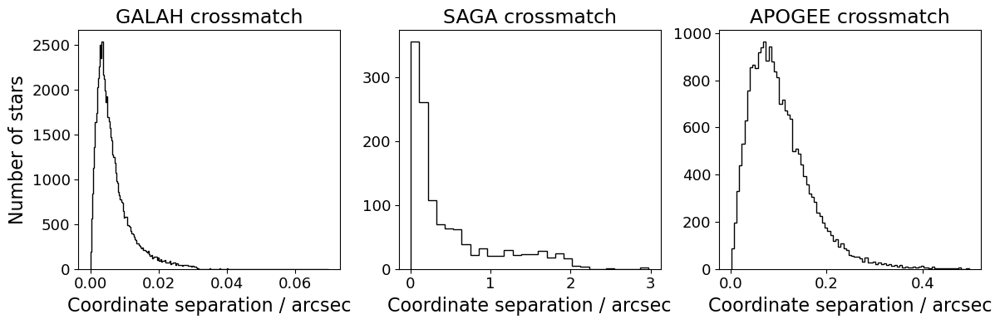

In [9]:
print('Number of SAGA objects with [Fe/H] is',len(Gmag[np.isnan(feh_s)==False]))
print('Number of SAGA objects with [M/H] is',len(Gmag[np.isnan(mh_s)==False]))

# first histogram of separation of coordinates (given by topcat) to verify crossmatch
fig,axs = plt.subplots(nrows=1,ncols=3,figsize=(12,4),sharey=False,sharex=False)
axs[0].hist(sep_g,bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[0].set_xlabel('Coordinate separation / arcsec',size=16)
axs[0].set_ylabel('Number of stars',size=16)
axs[0].set_title('GALAH crossmatch',size=17)
axs[0].tick_params(axis='both',labelsize=13)
axs[1].hist(sep_s,bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[1].set_xlabel('Coordinate separation / arcsec',size=16)
axs[1].set_title('SAGA crossmatch',size=17)
axs[1].tick_params(axis='both',labelsize=13)
axs[2].hist(sep_a,bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[2].set_xlabel('Coordinate separation / arcsec',size=16)
axs[2].set_title('APOGEE crossmatch',size=17)
axs[2].tick_params(axis='both',labelsize=13)
plt.tight_layout()
plt.savefig('figures/4_04_xmatch_sep.png',format='png')

# remove metallicity NaN rows condition
nan_g = (np.isnan(feh) == False) & (np.isnan(feh_g) == False)
nan_smh = (np.isnan(feh) == False) & (np.isnan(mh_s) == False)
nan_s = (np.isnan(feh) == False) & (np.isnan(feh_s) == False)
nan_d_full = (np.isnan(feh) == False) & (np.isnan(mh_xgboost_full)==False)
nan_d_rgb = (np.isnan(feh) == False) & (np.isnan(mh_xgboost_rgb)==False)
nan_a = (np.isnan(feh) == False) & (np.isnan(mh_a)==False) 

# define functions for fit, identity line etc.
def const(x,c):
    return 0*x+c

def lin_sp(x,b):
    return x+b

def lin(x,m,b):
    return m*x+b

# number of crossmatched objects
print('Number of crossmatched stars in GALAH:',len(Gmag[np.isnan(sep_g)==False]))
print('Number of crossmatched stars in SAGA:',len(Gmag[np.isnan(sep_s)==False]))
print('Number of crossmatched stars in APOGEE:',len(Gmag[np.isnan(sep_a)==False]))
print('Number of crossmatched stars in Andrae+23:',len(Gmag[np.isnan(mh_xgboost_full)==False]))
print('Number of crossmatched stars in Andrae+23 RGB sample:',len(Gmag[np.isnan(mh_xgboost_rgb)==False]))

Number of C-normal stars below the C-enhanced fit line: 85.71
Number of C-enhanced stars above the non-enhanced fit line: 83.84
Number of C-normal stars below the C-enhanced fit line: 88.31
Number of C-enhanced stars above the non-enhanced fit line: 85.86
According to the catalogue by Lucey et al. (2023), the number of C-enhanced stars that were found in the whole sample is 8278, which is 0.18% of the sample.
Below [Fe/H]=-1.0, it is 5204, which is 0.45% of the sample.
Below [Fe/H]=-1.5, it is 2475, which is 0.51% of the sample.
Below [Fe/H]=-2.0, it is 882, which is 0.39% of the sample.
In comparison, in the whole Lucey et al. (2023) catalogue 0.03% of stars are C-enhanced.


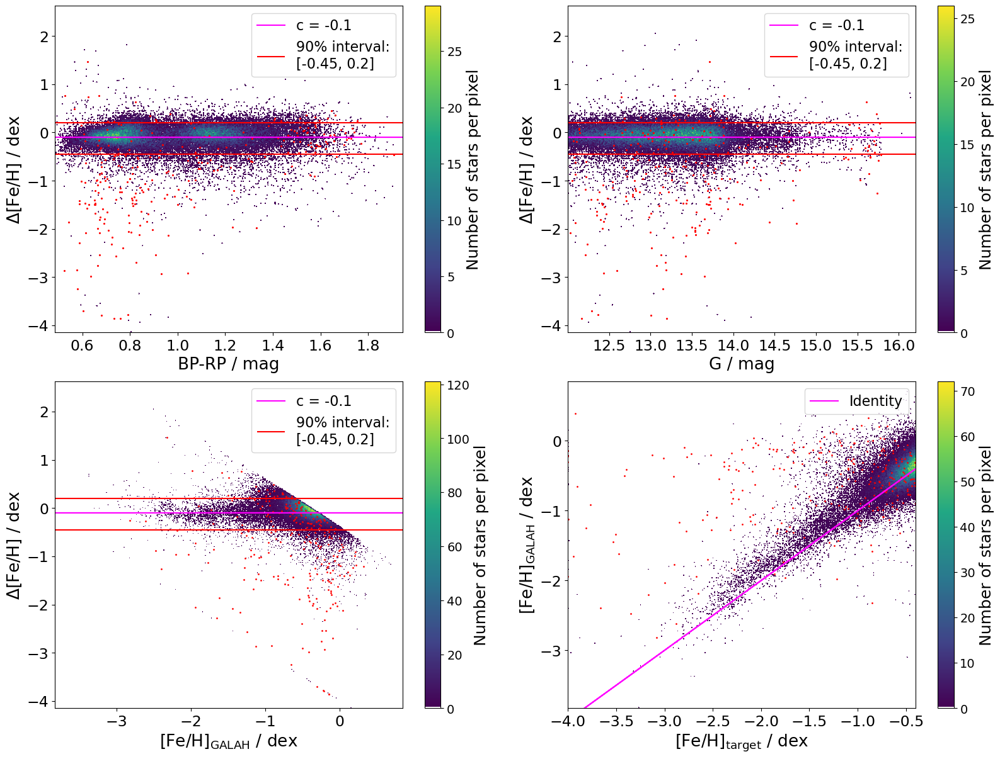

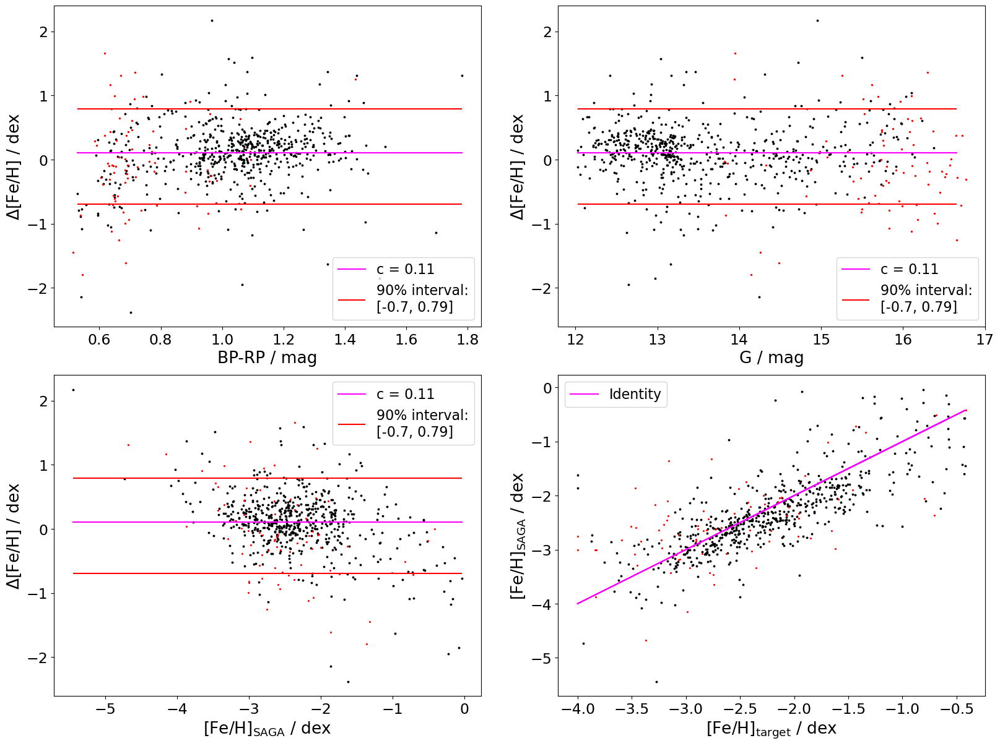

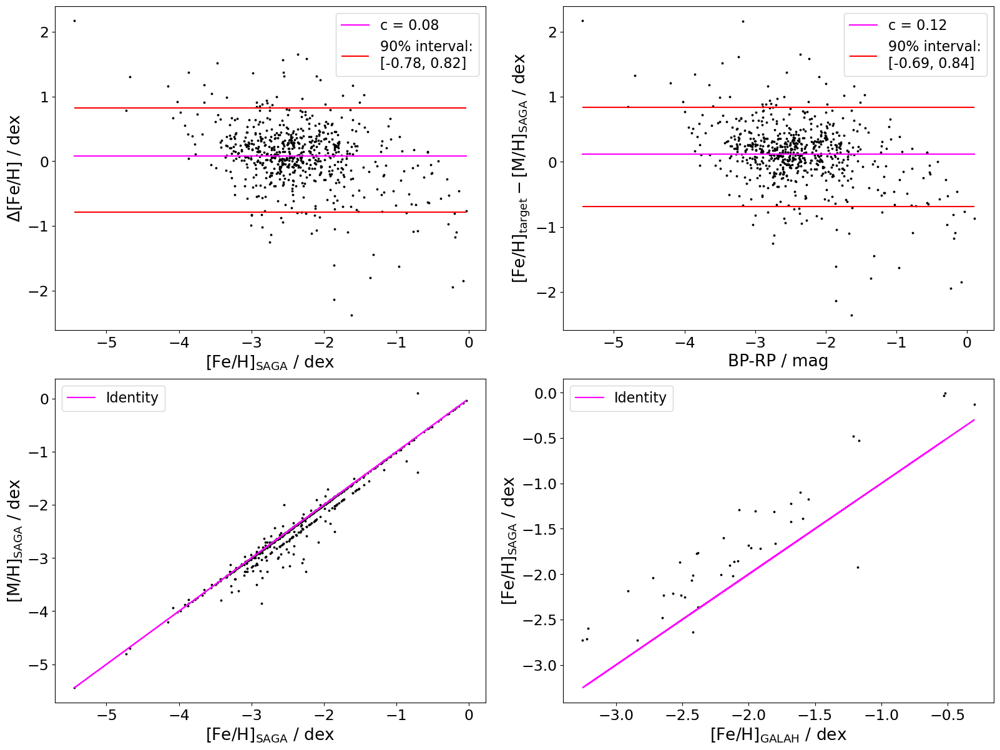

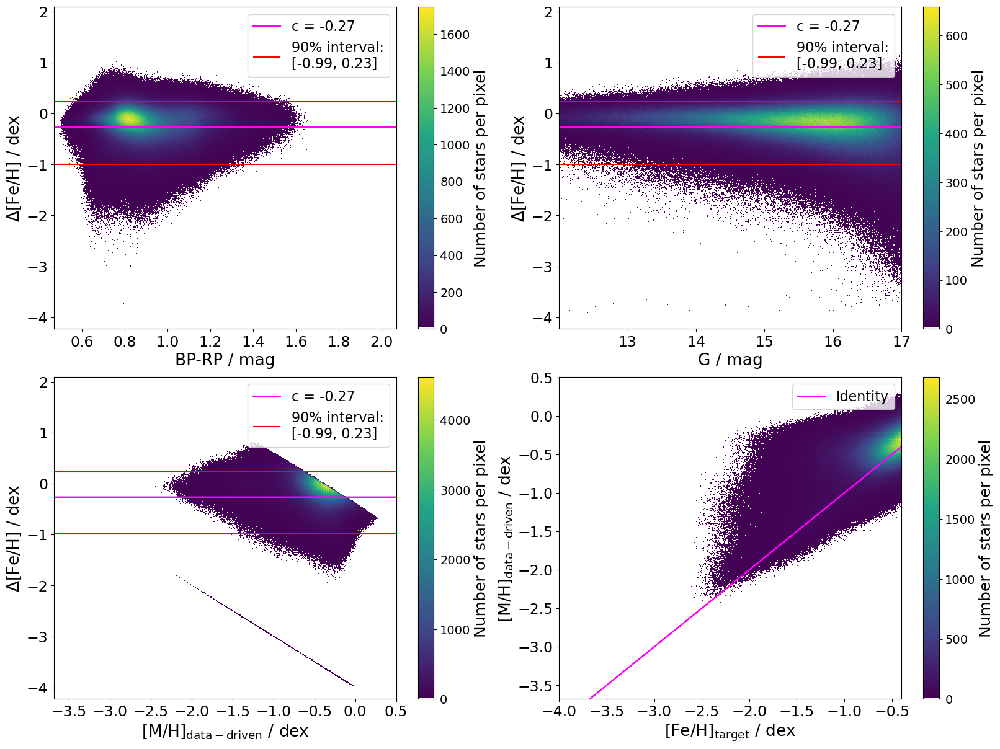

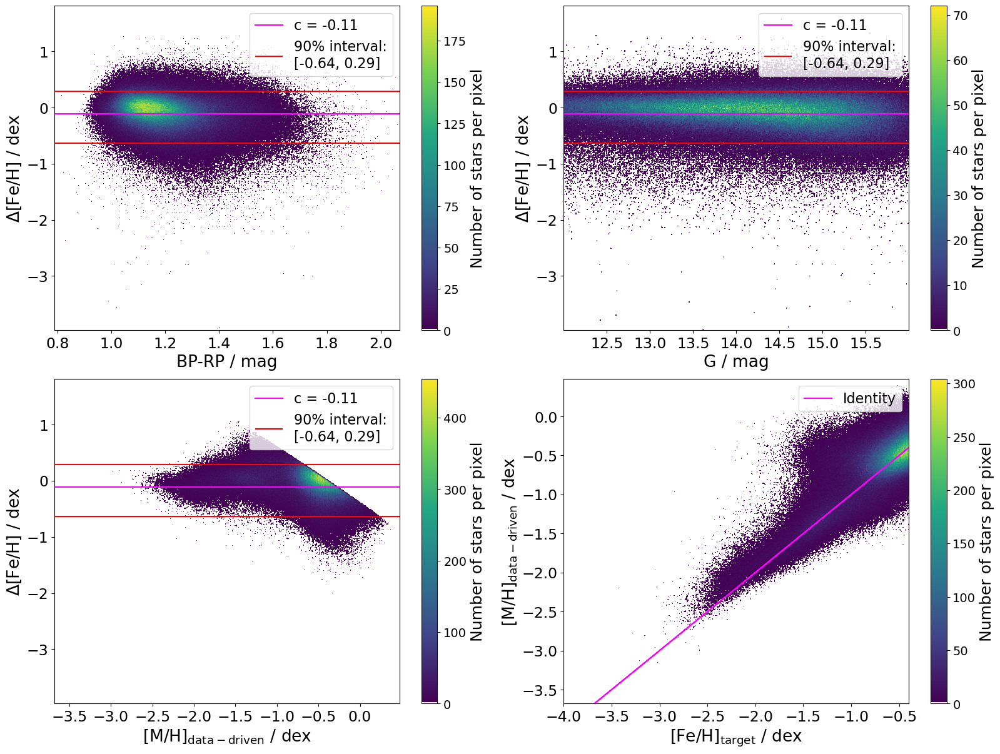

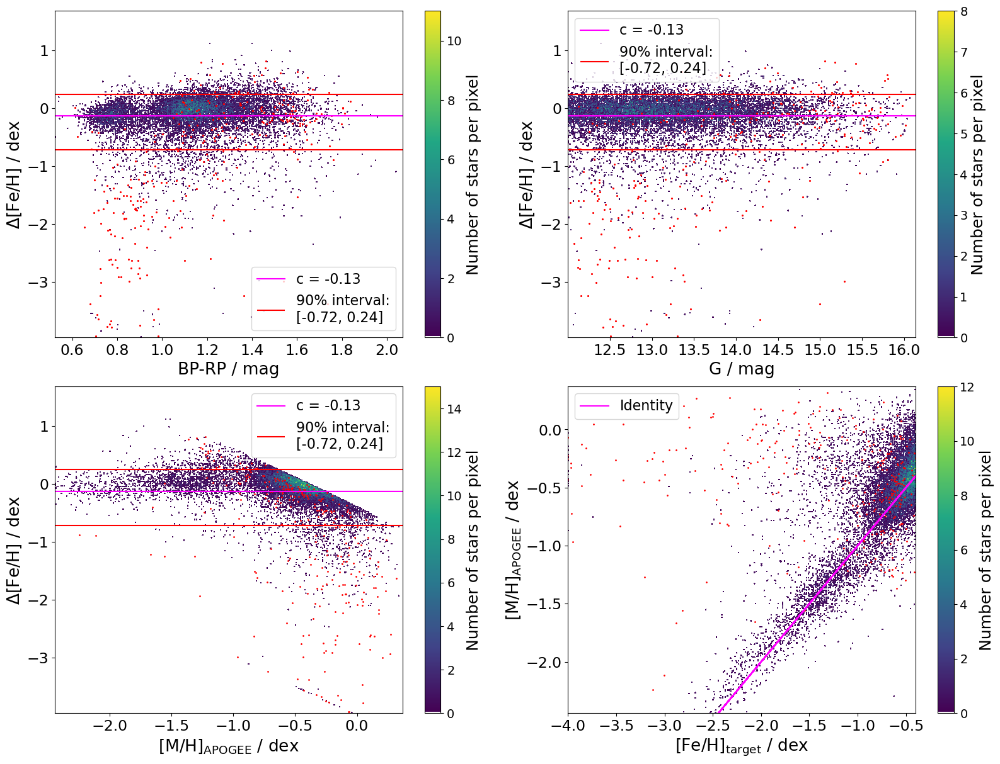

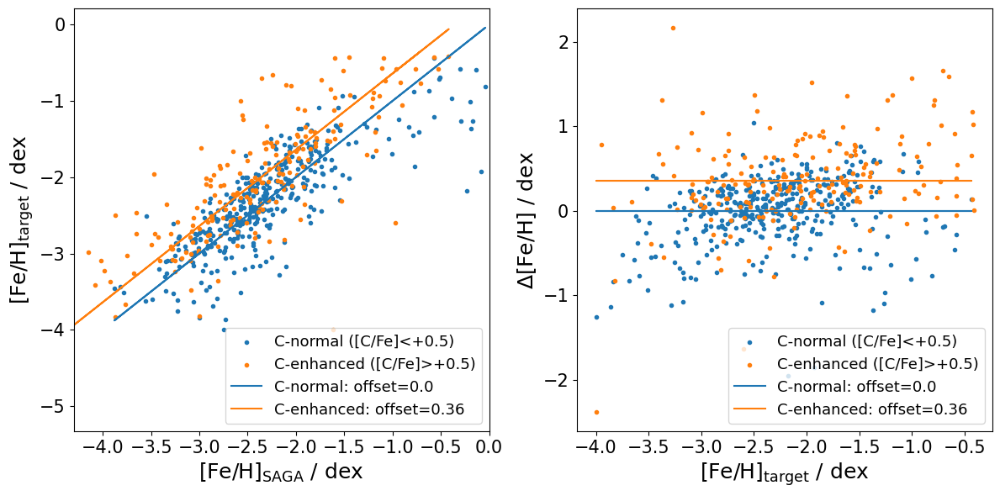

In [10]:
# metallicity verification plots
def met_ver_plot(fig,pos,xquan,yquan,cond,xlab,ylab,kind):
    # make the residual plots and fit constant line, also add percentiles
    if (kind=='00' or kind=='10'):
        popt,pcov=curve_fit(const,xquan[cond],yquan[cond])
        perc=90            # just enter percentage of data points you want within lines
        perc_low=(100-perc)/2
        perc_high=(100+perc)/2
        pgl=np.percentile(yquan[cond],perc_low)
        pgu=np.percentile(yquan[cond],perc_high)
    elif (kind=='01' or kind=='11'):
        popt,pcov=curve_fit(lin,xquan[cond],yquan[cond])
        perc=0
        pgl=0
        pgu=0
    
    indiv_plots(fig,pos,xquan,yquan,cond,popt,pgl,pgu,perc,xlab,ylab,kind)
    
def indiv_plots(fig,pos,xquan,yquan,cond,popt,pgl,pgu,perc,xlab,ylab,kind):
    ax = fig.add_subplot(2, 2, pos, projection='scatter_density')
    if (kind=='00' or kind=='01'):
        density = ax.scatter_density(xquan[cond],yquan[cond], cmap=white_viridis)
        cb=fig.colorbar(density)
        cb.set_label(label='Number of stars per pixel',size=18)
        cb.ax.tick_params(labelsize=14)
    elif (kind=='10' or kind=='11'):
        ax.scatter(xquan[cond],yquan[cond],s=3,color='black')
    if (kind=='00' or kind=='10'):
        plt.plot(xquan[cond],const(xquan[cond],popt),color='magenta',label='c = '+str(round(popt[0],2)))
        plt.hlines(pgl,xmin=np.min(xquan[cond]),xmax=np.max(xquan[cond]),color='red',label=str(perc)+'% interval:\n['+str(round(pgl,2))+', '+str(round(pgu,2))+']')
        plt.hlines(pgu,xmin=np.min(xquan[cond]),xmax=np.max(xquan[cond]),color='red')
    elif (kind=='01' or kind=='11'):
        plt.plot(xquan[cond],lin_sp(xquan[cond],0),color='magenta',label='Identity')
    plt.xlabel(xlab,size=19)
    plt.ylabel(ylab,size=19)
    plt.xticks(size=17)
    plt.yticks(size=17)
    plt.legend(fontsize=16)
    plt.subplots_adjust(hspace=0.15,wspace=0.18,left=0.05,top=0.99,right=0.99,bottom=0.06)

delta_feh_g=feh-feh_g
delta_feh_s=feh-feh_s#mh_s
delta_feh_a=feh-mh_a
delta_feh_ddm=feh-mh_xgboost_full
delta_feh_ddmrgb=feh-mh_xgboost_rgb
feh_good = ((feh84-feh16)/2<0.35)
    
# GALAH
figg=plt.figure(figsize=(16,12))
met_ver_plot(figg,1,bprp,delta_feh_g,nan_g & clean_flags & feh_good & (feh_g_flag==0),'BP-RP / mag','$\Delta$[Fe/H] / dex','00')
plt.scatter(bprp[(feh_good==False) & nan_g & clean_flags],delta_feh_g[(feh_good==False) & nan_g & clean_flags],color='red',s=1.5)
met_ver_plot(figg,2,Gmag,delta_feh_g,nan_g & clean_flags & feh_good,'G / mag','$\Delta$[Fe/H] / dex','00')
plt.scatter(Gmag[(feh_good==False) & nan_g & clean_flags],delta_feh_g[(feh_good==False) & nan_g & clean_flags],color='red',s=1.5)
met_ver_plot(figg,3,feh_g,delta_feh_g,nan_g & clean_flags & feh_good,'$\mathrm{[Fe/H]_{GALAH}}$ / dex','$\Delta$[Fe/H] / dex','00')
plt.scatter(feh_g[(feh_good==False) & nan_g & clean_flags],delta_feh_g[(feh_good==False) & nan_g & clean_flags],color='red',s=1)
met_ver_plot(figg,4,feh,feh_g,nan_g & clean_flags & feh_good,'$\mathrm{[Fe/H]_{target}}$ / dex','$\mathrm{[Fe/H]_{GALAH}}$ / dex','01')
plt.scatter(feh[(feh_good==False) & nan_g & clean_flags],feh_g[(feh_good==False) & nan_g & clean_flags],color='red',s=1)
plt.savefig('figures/4_05a_xmatch_galah.png',format='png')

# SAGA
figs=plt.figure(figsize=(16,12))
met_ver_plot(figs,1,bprp,delta_feh_s,feh_good & nan_s,'BP-RP / mag','$\Delta$[Fe/H] / dex','10')
plt.scatter(bprp[(feh_good==False) & nan_s],delta_feh_s[(feh_good==False) & nan_s],color='red',s=2)
met_ver_plot(figs,2,Gmag,delta_feh_s,feh_good & nan_s,'G / mag','$\Delta$[Fe/H] / dex','10')
plt.scatter(Gmag[(feh_good==False) & nan_s],delta_feh_s[(feh_good==False) & nan_s],color='red',s=2)
met_ver_plot(figs,3,feh_s,delta_feh_s,feh_good & nan_s,'$\mathrm{[Fe/H]_{SAGA}}$ / dex','$\Delta$[Fe/H] / dex','10')
plt.scatter(feh_s[(feh_good==False) & nan_s],delta_feh_s[(feh_good==False) & nan_s],color='red',s=1.5)
met_ver_plot(figs,4,feh,feh_s,feh_good & nan_s,'$\mathrm{[Fe/H]_{target}}$ / dex','$\mathrm{[Fe/H]_{SAGA}}$ / dex','11')
plt.scatter(feh[(feh_good==False) & nan_s],feh_s[(feh_good==False) & nan_s],color='red',s=1.5)
plt.savefig('figures/4_05b_xmatch_saga.png',format='png')

figsm=plt.figure(figsize=(16,12))
met_ver_plot(figsm,1,feh_s,feh-feh_s,nan_s & nan_smh,'$\mathrm{[Fe/H]_{SAGA}}$ / dex','$\Delta$[Fe/H] / dex','10')
met_ver_plot(figsm,2,mh_s,feh-mh_s,nan_s & nan_smh,'BP-RP / mag','$\mathrm{[Fe/H]_{target}}-\mathrm{[M/H]_{SAGA}}$ / dex','10')
met_ver_plot(figsm,3,feh_s,mh_s,nan_s & nan_smh,'$\mathrm{[Fe/H]_{SAGA}}$ / dex','$\mathrm{[M/H]_{SAGA}}$ / dex','11')
met_ver_plot(figsm,4,feh_s,feh_g,nan_s & nan_smh & nan_g,'$\mathrm{[Fe/H]_{GALAH}}$ / dex','$\mathrm{[Fe/H]_{SAGA}}$ / dex','11')
plt.savefig('figures/4_05c_saga_feh_mh.png',format='png')

# data-driven metallicities (Andrae et al. 2023)
figd1=plt.figure(figsize=(16,12))
met_ver_plot(figd1,1,bprp,delta_feh_ddm,nan_d_full,'BP-RP / mag','$\Delta$[Fe/H] / dex','00')
#plt.scatter(bprp[(feh_good==False) & nan_d_full],delta_feh_ddm[(feh_good==False) & nan_d_full],color='red',s=1)
met_ver_plot(figd1,2,Gmag,delta_feh_ddm,nan_d_full,'G / mag','$\Delta$[Fe/H] / dex','00')
#plt.scatter(Gmag[(feh_good==False) & nan_d_full],delta_feh_ddm[(feh_good==False) & nan_d_full],color='red',s=1)
met_ver_plot(figd1,3,mh_xgboost_full,delta_feh_ddm,nan_d_full,'$\mathrm{[M/H]_{data-driven}}$ / dex','$\Delta$[Fe/H] / dex','00')
#plt.scatter(mh_xgboost_full[(feh_good==False) & nan_d_full],delta_feh_ddm[(feh_good==False) & nan_d_full],color='red',s=1)
met_ver_plot(figd1,4,feh,mh_xgboost_full,nan_d_full,'$\mathrm{[Fe/H]_{target}}$ / dex','$\mathrm{[M/H]_{data-driven}}$ / dex','01')
#plt.scatter(feh[(feh_good==False) & nan_d_full],mh_xgboost_full[(feh_good==False) & nan_d_full],color='red',s=1)
plt.savefig('figures/4_05d_xmatch_ddm.png',format='png')

figd2=plt.figure(figsize=(16,12))
met_ver_plot(figd2,1,bprp,delta_feh_ddmrgb,nan_d_rgb,'BP-RP / mag','$\Delta$[Fe/H] / dex','00')
#plt.scatter(bprp[(feh_good==False) & nan_d_rgb],delta_feh_ddmrgb[(feh_good==False) & nan_d_rgb],color='red',s=1)
met_ver_plot(figd2,2,Gmag,delta_feh_ddmrgb,nan_d_rgb,'G / mag','$\Delta$[Fe/H] / dex','00')
#plt.scatter(Gmag[(feh_good==False) & nan_d_rgb],delta_feh_ddmrgb[(feh_good==False) & nan_d_rgb],color='red',s=1)
met_ver_plot(figd2,3,mh_xgboost_rgb,delta_feh_ddmrgb,nan_d_rgb,'$\mathrm{[M/H]_{data-driven}}$ / dex','$\Delta$[Fe/H] / dex','00')
#plt.scatter(mh_xgboost_rgb[(feh_good==False) & nan_d_rgb],delta_feh_ddmrgb[(feh_good==False) & nan_d_rgb],color='red',s=1)
met_ver_plot(figd2,4,feh,mh_xgboost_rgb,nan_d_rgb,'$\mathrm{[Fe/H]_{target}}$ / dex','$\mathrm{[M/H]_{data-driven}}$ / dex','01')
#plt.scatter(feh[(feh_good==False) & nan_d_rgb],mh_xgboost_rgb[(feh_good==False) & nan_d_rgb],color='red',s=1)
plt.savefig('figures/4_05e_xmatch_ddmrgb.png',format='png')

# APOGEE
figa=plt.figure(figsize=(16,12))
met_ver_plot(figa,1,bprp,delta_feh_a,feh_good & nan_a & clean_flags_apo,'BP-RP / mag','$\Delta$[Fe/H] / dex','00')
plt.scatter(bprp[(feh_good==False) & nan_a & clean_flags_apo],delta_feh_a[(feh_good==False) & nan_a & clean_flags_apo],color='red',s=1.5)
met_ver_plot(figa,2,Gmag,delta_feh_a,feh_good & nan_a & clean_flags_apo,'G / mag','$\Delta$[Fe/H] / dex','00')
plt.scatter(Gmag[(feh_good==False) & nan_a & clean_flags_apo],delta_feh_a[(feh_good==False) & nan_a & clean_flags_apo],color='red',s=1.5)
met_ver_plot(figa,3,mh_a,delta_feh_a,feh_good & nan_a & clean_flags_apo,'$\mathrm{[M/H]_{APOGEE}}$ / dex','$\Delta$[Fe/H] / dex','00')
plt.scatter(mh_a[(feh_good==False) & nan_a & clean_flags_apo],delta_feh_a[(feh_good==False) & nan_a & clean_flags_apo],color='red',s=1)
met_ver_plot(figa,4,feh,mh_a,feh_good & nan_a & clean_flags_apo,'$\mathrm{[Fe/H]_{target}}$ / dex','$\mathrm{[M/H]_{APOGEE}}$ / dex','01')
plt.scatter(feh[(feh_good==False) & nan_a & clean_flags_apo],mh_a[(feh_good==False) & nan_a & clean_flags_apo],color='red',s=1)
plt.savefig('figures/4_05f_xmatch_apogee.png',format='png')

# check for systematic differences due to carbon enhancement using SAGA
fig=plt.figure(figsize=(12,6))
ax = fig.add_subplot(1, 2, 1)
poptcn,pcovcn=curve_fit(lin_sp,feh_s[(c_h_s-feh_s<0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)],feh[(c_h_s-feh_s<0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)])
poptce,pcovce=curve_fit(lin_sp,feh_s[(c_h_s-feh_s>0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)],feh[(c_h_s-feh_s>0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)])
print('Number of C-normal stars below the C-enhanced fit line:',round(100*len(feh[(feh<(lin_sp(feh_s,poptce[0]))) & (c_h_s-feh_s<0.5) & (np.isnan(feh) == False)])/len(feh[(np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False) & (c_h_s-feh_s<0.5)]),2))
print('Number of C-enhanced stars above the non-enhanced fit line:',round(100*len(feh[(feh>(lin_sp(feh_s,poptcn[0]))) & (c_h_s-feh_s>0.5) & (np.isnan(feh) == False)])/len(feh[(np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False) & (c_h_s-feh_s>0.5)]),2))
plt.scatter(feh_s[(c_h_s-feh_s<0.5)],feh[(c_h_s-feh_s<0.5)],s=9,label='C-normal ([C/Fe]<+0.5)')
plt.scatter(feh_s[(c_h_s-feh_s>0.5)],feh[(c_h_s-feh_s>0.5)],s=9,label='C-enhanced ([C/Fe]>+0.5)')
plt.plot(feh_s[(c_h_s-feh_s<0.5)],lin_sp(feh_s[(c_h_s-feh_s<0.5)],poptcn[0]),label='C-normal: offset='+str(round(poptcn[0],2)))
plt.plot(feh_s[(c_h_s-feh_s>0.5)],lin_sp(feh_s[(c_h_s-feh_s>0.5)],poptce[0]),label='C-enhanced: offset='+str(round(poptce[0],2)))
plt.xlabel('$\mathrm{[Fe/H]_{SAGA}}$ / dex',size=18)
plt.ylabel('$\mathrm{[Fe/H]_{target}}$ / dex',size=18)
plt.xticks(size=15)
plt.yticks(size=15)
plt.xlim(-4.3,0)
plt.legend(fontsize=13,loc=4)
ax = fig.add_subplot(1, 2, 2)
poptcn,pcovcn=curve_fit(const,feh[(c_h_s-feh_s<0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)],feh[(c_h_s-feh_s<0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)]-feh_s[(c_h_s-feh_s<0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)])
poptce,pcovce=curve_fit(const,feh[(c_h_s-feh_s>0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)],feh[(c_h_s-feh_s>0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)]-feh_s[(c_h_s-feh_s>0.5) & (np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False)])
print('Number of C-normal stars below the C-enhanced fit line:',round(100*len(feh[(c_h_s-feh_s<0.5) & (feh-feh_s<0.39) & (np.isnan(feh) == False)])/len(feh[(np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False) & (c_h_s-feh_s<0.5)]),2))
print('Number of C-enhanced stars above the non-enhanced fit line:',round(100*len(feh[(c_h_s-feh_s>0.5) & (feh-feh_s>-0.03) & (np.isnan(feh) == False)])/len(feh[(np.isnan(c_h_s)==False) & (np.isnan(feh_s)==False) & (np.isnan(feh) == False) & (c_h_s-feh_s>0.5)]),2))
plt.scatter(feh[(c_h_s-feh_s<0.5)],feh[(c_h_s-feh_s<0.5)]-feh_s[(c_h_s-feh_s<0.5)],s=9,label='C-normal ([C/Fe]<+0.5)')
plt.scatter(feh[(c_h_s-feh_s>0.5)],feh[(c_h_s-feh_s>0.5)]-feh_s[(c_h_s-feh_s>0.5)],s=9,label='C-enhanced ([C/Fe]>+0.5)')
plt.plot(feh[(c_h_s-feh_s<0.5)],const(feh[(c_h_s-feh_s<0.5)],poptcn[0]),label='C-normal: offset='+str(round(poptcn[0],2)))
plt.plot(feh[(c_h_s-feh_s<0.5)],const(feh[(c_h_s-feh_s<0.5)],poptce[0]),label='C-enhanced: offset='+str(round(poptce[0],2)))
plt.xlabel('$\mathrm{[Fe/H]_{target}}$ / dex',size=18)
plt.ylabel('$\Delta\mathrm{[Fe/H]}$ / dex',size=18)
plt.xticks(size=15)
plt.yticks(size=15)
plt.legend(fontsize=13)
plt.tight_layout()
plt.savefig('figures/4_06_c_enhancement.png',format='png')

print('According to the catalogue by Lucey et al. (2023), the number of C-enhanced stars that were found in the whole sample is '+str(len(feh[np.isnan(c_pred)==False]))+', which is '+str(round(100*len(feh[np.isnan(c_pred)==False])/len(feh),2))+'% of the sample.')
print('Below [Fe/H]=-1.0, it is '+str(len(feh[(np.isnan(c_pred)==False) & (feh<-1)]))+', which is '+str(round(100*len(feh[(np.isnan(c_pred)==False) & (feh<-1)])/len(feh[feh<-1]),2))+'% of the sample.')
print('Below [Fe/H]=-1.5, it is '+str(len(feh[(np.isnan(c_pred)==False) & (feh<-1.5)]))+', which is '+str(round(100*len(feh[(np.isnan(c_pred)==False) & (feh<-1.5)])/len(feh[feh<-1.5]),2))+'% of the sample.')
print('Below [Fe/H]=-2.0, it is '+str(len(feh[(np.isnan(c_pred)==False) & (feh<-2)]))+', which is '+str(round(100*len(feh[(np.isnan(c_pred)==False) & (feh<-2)])/len(feh[feh<-2]),2))+'% of the sample.')
print('In comparison, in the whole Lucey et al. (2023) catalogue '+str(round(100*58872/182815672,2))+'% of stars are C-enhanced.')

# 4.3. The objects not selected by target catalogue

In [11]:
path_galahall='data/GALAHDR3_GaiaDR3.fits'

hdul_galahall = fits.open(path_galahall, memmap=True)
data_galahall = Table(hdul_galahall[1].data)
hdul_galahall.close()

hdu_saga = fits.open('data/saga_table_recommended.fits', memmap=True)
saga_data = Table(Table.MaskedColumn(hdu_saga[1].data))
hdu_saga.close()

data_galahall

galah_dr3_oid,star_id,sobject_id,dr2_source_id,dr3_source_id,survey_name,field_id,flag_repeat,wg4_field,wg4_pipeline,flag_sp,teff,e_teff,irfm_teff,irfm_ebv,irfm_ebv_ref,logg,e_logg,fe_h,e_fe_h,flag_fe_h,fe_h_atmo,vmic,vbroad,e_vbroad,chi2_sp,alpha_fe,e_alpha_fe,nr_alpha_fe,flag_alpha_fe,flux_a_fe,chi_a_fe,li_fe,e_li_fe,nr_li_fe,flag_li_fe,c_fe,e_c_fe,nr_c_fe,flag_c_fe,o_fe,e_o_fe,nr_o_fe,flag_o_fe,na_fe,e_na_fe,nr_na_fe,flag_na_fe,mg_fe,e_mg_fe,nr_mg_fe,flag_mg_fe,al_fe,e_al_fe,nr_al_fe,flag_al_fe,si_fe,e_si_fe,nr_si_fe,flag_si_fe,k_fe,e_k_fe,nr_k_fe,flag_k_fe,ca_fe,e_ca_fe,nr_ca_fe,flag_ca_fe,sc_fe,e_sc_fe,nr_sc_fe,flag_sc_fe,sc2_fe,e_sc2_fe,nr_sc2_fe,flag_sc2_fe,ti_fe,e_ti_fe,nr_ti_fe,flag_ti_fe,ti2_fe,e_ti2_fe,nr_ti2_fe,flag_ti2_fe,v_fe,e_v_fe,nr_v_fe,flag_v_fe,cr_fe,e_cr_fe,nr_cr_fe,flag_cr_fe,cr2_fe,e_cr2_fe,nr_cr2_fe,flag_cr2_fe,mn_fe,e_mn_fe,nr_mn_fe,flag_mn_fe,co_fe,e_co_fe,nr_co_fe,flag_co_fe,ni_fe,e_ni_fe,nr_ni_fe,flag_ni_fe,cu_fe,e_cu_fe,nr_cu_fe,flag_cu_fe,zn_fe,e_zn_fe,nr_zn_fe,flag_zn_fe,rb_fe,e_rb_fe,nr_rb_fe,flag_rb_fe,sr_fe,e_sr_fe,nr_sr_fe,flag_sr_fe,y_fe,e_y_fe,nr_y_fe,flag_y_fe,zr_fe,e_zr_fe,nr_zr_fe,flag_zr_fe,mo_fe,e_mo_fe,nr_mo_fe,flag_mo_fe,ru_fe,e_ru_fe,nr_ru_fe,flag_ru_fe,ba_fe,e_ba_fe,nr_ba_fe,flag_ba_fe,la_fe,e_la_fe,nr_la_fe,flag_la_fe,ce_fe,e_ce_fe,nr_ce_fe,flag_ce_fe,nd_fe,e_nd_fe,nr_nd_fe,flag_nd_fe,sm_fe,e_sm_fe,nr_sm_fe,flag_sm_fe,eu_fe,e_eu_fe,nr_eu_fe,flag_eu_fe,ra_dr2,dec_dr2,parallax_dr2,parallax_error_dr2,r_est_dr2,r_lo_dr2,r_hi_dr2,r_len_dr2,rv_galah,e_rv_galah,rv_gaia_dr2,e_rv_gaia_dr2,red_flag,ebv,snr_c1_iraf,snr_c2_iraf,snr_c3_iraf,snr_c4_iraf,flag_guess,v_jk,j_m,j_msigcom,h_m,h_msigcom,ks_m,ks_msigcom,ph_qual_tmass,w2mpro,w2mpro_error,ph_qual_wise,a_ks,e_a_ks,bc_ks,ruwe_dr2,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,l,b,ecl_lon,ecl_lat,nu_eff_used_in_astrometry,astrometric_params_solved,pseudocolour,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag
int32,str16,int64,int64,int64,str12,int64,int64,str6,str4,int64,float32,float64,float32,float32,str3,float32,float64,float32,float64,int64,float32,float32,float32,float64,float32,float64,float64,float64,int64,float32,float32,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float32,float32,int64,float64,float64,float64,float64,float64,int64,float32,float32,float32,float32,float32,float32,float32,str3,float64,float64,str4,float64,float64,float32,float64,int64,float64,float32,float64,float32,float64,float32,float64,float32,float64,float32,float64,float64,float64,float64,float32,int16,float32,float32,float32,float32
1,03325271-6840304,131116000501002,4667368899326729856,4667368899326729856,galah_main,138,0,10k_2,lbol,0,4553.3545,137.06088556228917,4138.0,0.048,sfd,4.7149534,0.20121636742743593,-0.33501863,0.12021913955493135,0,-0.109347336,0.94853675,9.345594,2.5080910007092827,0.5873856,0.35136763119226394,0.07919326531297675,405.0,0,0.73446965,0.80794984,-0.18375580310821538,0.12854836388714738,1,1,nan,nan,-9223372036854775808,32,1.2146472740173344,0.2138

In [12]:
ra_galahall = data_galahall['ra']
dec_galahall = data_galahall['dec']
paral_galahall = data_galahall['parallax']
paral_e_galahall = data_galahall['parallax_error']
l_galahall = data_galahall['l']
b_galahall = data_galahall['b']
gmag_galahall = data_galahall['phot_g_mean_mag']
bp_galahall = data_galahall['phot_bp_mean_mag']
rp_galahall = data_galahall['phot_rp_mean_mag']
bgal_galahall = data_galahall['b']
feh_galahall = data_galahall['fe_h']
feh_galahall_flag = data_galahall['flag_fe_h']
alpha_fe_all = data_galahall['alpha_fe']
alpha_fe_all_flag = data_galahall['flag_alpha_fe']
c_fe_all = data_galahall['c_fe']
c_fe_all_flag = data_galahall['flag_c_fe']
eu_fe_all = data_galahall['eu_fe']
eu_fe_all_flag = data_galahall['flag_eu_fe']
ba_fe_all = data_galahall['ba_fe']
ba_fe_all_flag = data_galahall['flag_ba_fe']
flag_sp_all = data_galahall['flag_sp']
ebv_all = data_galahall['ebv']

RA=saga_data['RA_deg']
Dec=saga_data['Dec_deg']
m_h=saga_data['[M/H]']
fe_h=saga_data['[Fe/H]']
vmag=saga_data['V']
bmag=saga_data['B']
b_v=saga_data['B-V']
hmag=saga_data['H']
imag=saga_data['I']
jmag=saga_data['J']
kmag=saga_data['K']
rmag=saga_data['R']
sdss_g=saga_data['SDSS g']
sdss_r=saga_data['SDSS r']
sdss_i=saga_data['SDSS i']

saga_data=[]
data_galahall=[]

/tmp/ipykernel_7635/3547949847.py:2: RuntimeWarning: invalid value encountered in log10
  M_G_galahall = gmag_galahall + 5 + 5*np.log10(paral_galahall/1000)


Number of objects in crossmatch with GALAH: 62988
Number of objects in GALAH DR3 main catalogue: 588464
Number of objects after survey area condition: 336083
Number of objects after G magnitude condition: 301727
Number of objects after colour and M_G condition: 280989
Number of objects after metallicity condition: 64921
Using a metallicity cutoff of -0.3: 94232


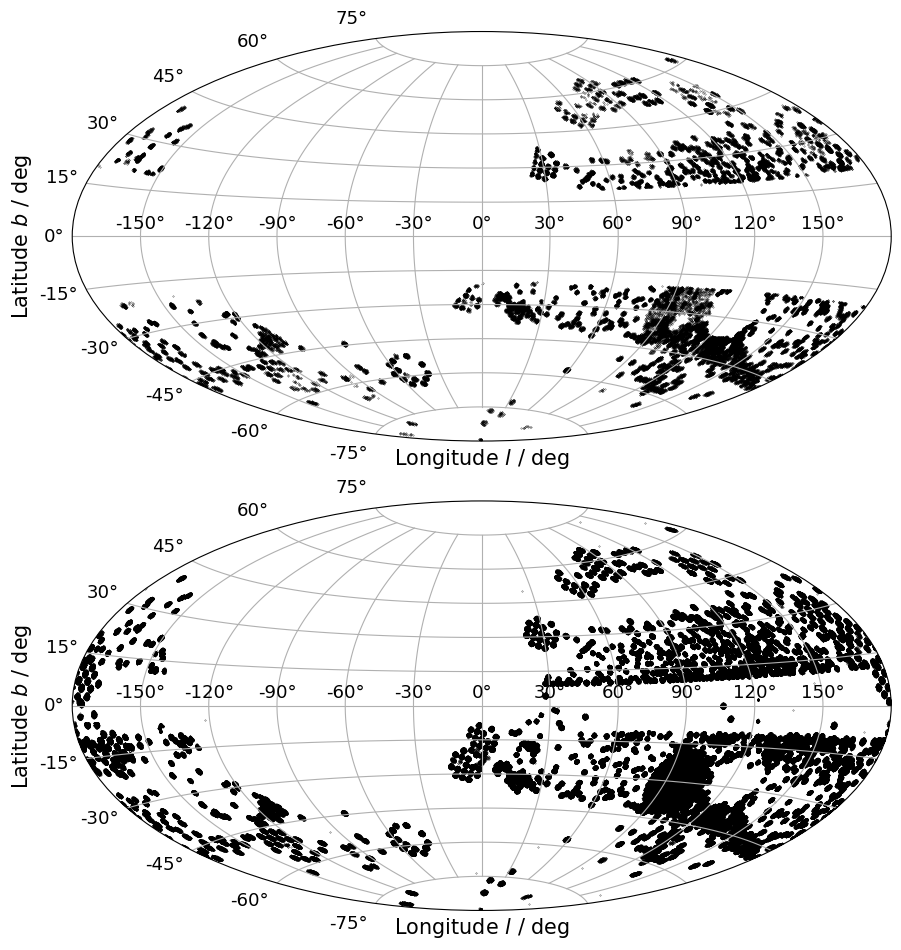

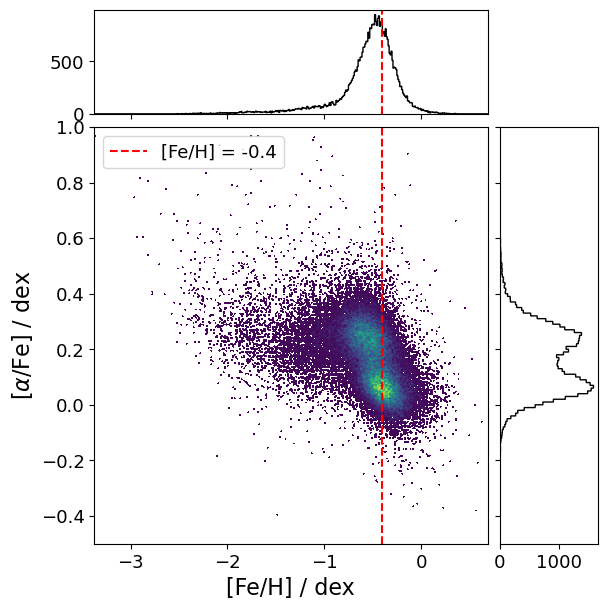

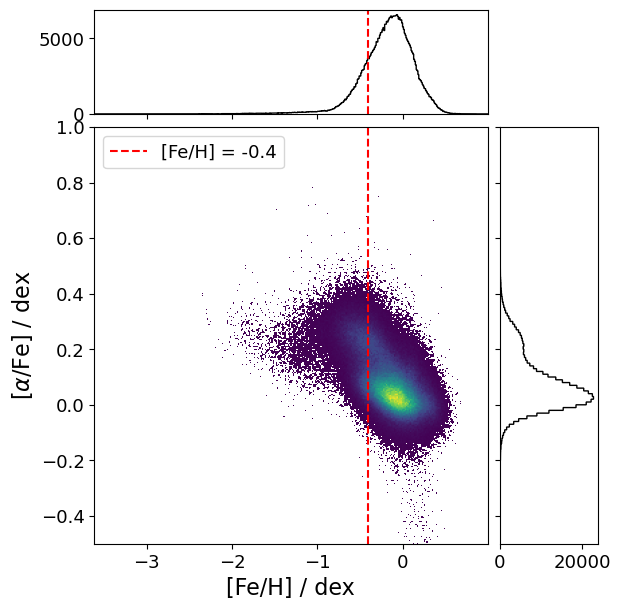

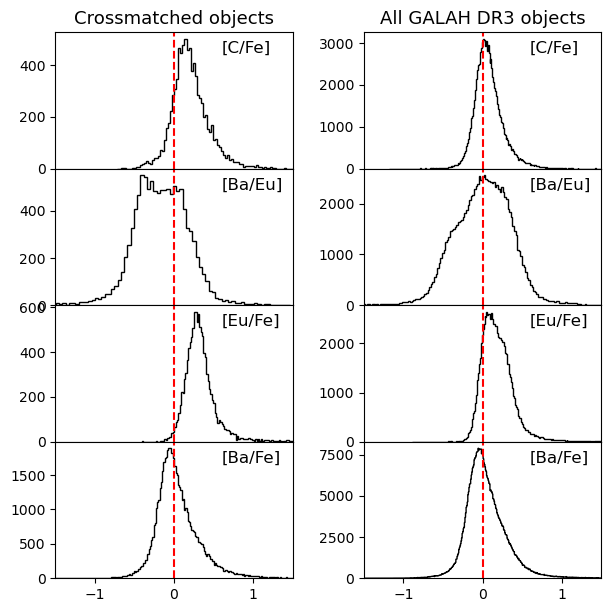

In [13]:
# almost all objects have good parallax measurement so I just calculate absolute magnitude with parallax
M_G_galahall = gmag_galahall + 5 + 5*np.log10(paral_galahall/1000)
ebprp_all = 0.0187 + (1.6814*ebv_all) + (-0.3357*ebv_all**2) + (0.1117*ebv_all**3)
bp_rp_galahall = bp_galahall - rp_galahall - ebprp_all

survey_area = (dec_galahall >= -80) & (dec_galahall <= 20) & (np.abs(bgal_galahall) > 20)
brightness_range = (gmag_galahall >= 12) & (gmag_galahall <= 17)
colour_range = (bp_rp_galahall >= 0.15) & (bp_rp_galahall <= 1.1)
colour_absmagn = (bp_rp_galahall >= 1.1) & (bp_rp_galahall <= 1.6) & (M_G_galahall < 3.5)
metal_range = (feh_galahall <= -0.4)

# check where all the objects "get lost"
print('Number of objects in crossmatch with GALAH:',len(feh[flag_sp!=-2**63]))
print('Number of objects in GALAH DR3 main catalogue:',len(feh_galahall))
print('Number of objects after survey area condition:',len(feh_galahall[survey_area]))
print('Number of objects after G magnitude condition:',len(feh_galahall[survey_area & brightness_range]))
print('Number of objects after colour and M_G condition:',len(feh_galahall[survey_area & brightness_range & colour_range])+len(feh_galahall[survey_area & brightness_range & colour_absmagn]))
print('Number of objects after metallicity condition:',len(feh_galahall[survey_area & brightness_range & colour_range & metal_range])+len(feh_galahall[survey_area & brightness_range & colour_absmagn & metal_range]))

metal_range = (feh_galahall <=-0.3)
print('Using a metallicity cutoff of -0.3:',len(feh_galahall[survey_area & brightness_range & colour_range & metal_range])+len(feh_galahall[survey_area & brightness_range & colour_absmagn & metal_range]))

# Galactic coordinates of crossmatched sample and full sample
l_galah = l[flag_sp!=-2**63]
b_galah = b[flag_sp!=-2**63]
l_galah_geo = l_galah*np.pi/180-np.pi
b_galah_geo = b_galah*np.pi/180

l_galahall_geo = l_galahall*np.pi/180-np.pi
b_galahall_geo = b_galahall*np.pi/180

fig1=plt.figure(figsize=(9,9.5))
ax = fig1.add_subplot(2, 1, 1, projection='aitoff')
ax.scatter(l_galah_geo,b_galah_geo,marker='.',s=0.2,color='black')
plt.xlabel('Longitude $l$ / deg',size=15)
plt.ylabel('Latitude $b$ / deg',size=15)
plt.xticks(size=13)
plt.yticks(size=13)
plt.grid()
ax = fig1.add_subplot(2, 1, 2, projection='aitoff')
ax.scatter(l_galahall_geo,b_galahall_geo,marker='.',s=0.2,color='black')
plt.xlabel('Longitude $l$ / deg',size=15)
plt.ylabel('Latitude $b$ / deg',size=15)
plt.xticks(size=13)
plt.yticks(size=13)
plt.grid()
plt.subplots_adjust(hspace=-0.3,wspace=0,left=0.08,right=0.99,bottom=-0.1,top=1.1)
plt.savefig('figures/4_07_galah_galcoord_distr.png',format='png')

# compare alpha abundance distribution
def scatter_hist_fealpha(x, y, ax, ax_histx, ax_histy, title):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    density = ax.scatter_density(x,y, cmap=white_viridis)
    ax.set_xlabel('[Fe/H] / dex',size=16)
    ax.set_ylabel(r'[$\alpha$/Fe] / dex', size=16)
    ax.set_ylim(-0.5,1)
    ax.axvline(-0.4,linestyle='dashed',color='red',label='[Fe/H] = -0.4')
    ax.legend(fontsize=13)
    ax.tick_params(axis='both',labelsize=13)

    binwidth = 0.01
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
    lim = (int(xymax/binwidth) + 1) * binwidth

    bins = np.arange(-lim, lim + binwidth, binwidth)
    ax_histx.hist(x, bins=bins,histtype='step', stacked=True, fill=False,color='black')
    ax_histy.hist(y, bins=bins, orientation='horizontal',histtype='step', stacked=True, fill=False,color='black')
    ax_histx.tick_params(axis='y',labelsize=13)
    ax_histy.tick_params(axis='x',labelsize=13)
    ax_histx.axvline(-0.4,linestyle='dashed',color='red',label='[Fe/H] = -0.4')
    
fig1 = plt.figure(figsize=(6,6))
x = feh_g[(np.isnan(feh_g)==False) & (np.isnan(alphafe_g)==False) & (flag_sp==0) & (feh_g_flag==0) & (alphafe_g_flag==0)]
y = alphafe_g[(np.isnan(feh_g)==False) & (np.isnan(alphafe_g)==False) & (flag_sp==0) & (feh_g_flag==0) & (alphafe_g_flag==0)]
gs = fig1.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.14, right=0.98, bottom=0.1, top=0.99,
                      wspace=0.05, hspace=0.05)
ax = fig1.add_subplot(gs[1, 0], projection='scatter_density')
ax_histx = fig1.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig1.add_subplot(gs[1, 1], sharey=ax)
scatter_hist_fealpha(x, y, ax, ax_histx, ax_histy,'Crossmatched objects')
plt.savefig('figures/4_08a_alphavsfe_xmatch.png',format='png')

fig2 = plt.figure(figsize=(6,6))
x = feh_galahall[(np.isnan(feh_galahall)==False) & (np.isnan(alpha_fe_all)==False) & (flag_sp_all==0) & (feh_galahall_flag==0) & (alpha_fe_all_flag==0)]
y = alpha_fe_all[(np.isnan(feh_galahall)==False) & (np.isnan(alpha_fe_all)==False) & (flag_sp_all==0) & (feh_galahall_flag==0) & (alpha_fe_all_flag==0)]
gs = fig1.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.14, right=0.98, bottom=0.1, top=0.99,
                      wspace=0.05, hspace=0.05)
ax = fig2.add_subplot(gs[1, 0], projection='scatter_density')
ax_histx = fig2.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig2.add_subplot(gs[1, 1], sharey=ax)
scatter_hist_fealpha(x, y, ax, ax_histx, ax_histy,'All GALAH DR3 objects')
plt.savefig('figures/4_08b_alphavsfe_all.png',format='png')

ba_eu = ba_fe - eu_fe
ba_eu_all = ba_fe_all - eu_fe_all

# histograms of some elemental abundances
fig,axs = plt.subplots(nrows=4,ncols=2,figsize=(6,6),sharex=True,sharey=False)
axs[0,0].hist(c_fe[c_fe_flag==0],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[0,0].axvline(0,color='red',linestyle='dashed')
axs[0,0].annotate('[C/Fe]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[0,0].set_xlim(-1.5,1.5)
axs[0,0].set_title('Crossmatched objects',size=13)
axs[0,1].hist(c_fe_all[c_fe_all_flag==0],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[0,1].axvline(0,color='red',linestyle='dashed')
axs[0,1].set_title('All GALAH DR3 objects',size=13)
axs[0,1].annotate('[C/Fe]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[1,0].hist(ba_eu[(ba_fe_flag==0) & (eu_fe_flag==0)],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[1,0].axvline(0,color='red',linestyle='dashed')
axs[1,0].annotate('[Ba/Eu]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[1,1].hist(ba_eu_all[(ba_fe_all_flag==0) & (eu_fe_all_flag==0)],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[1,1].axvline(0,color='red',linestyle='dashed')
axs[1,1].annotate('[Ba/Eu]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[2,0].hist(eu_fe[eu_fe_flag==0],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[2,0].axvline(0,color='red',linestyle='dashed')
axs[2,0].annotate('[Eu/Fe]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[2,1].hist(eu_fe_all[eu_fe_all_flag==0],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[2,1].axvline(0,color='red',linestyle='dashed')
axs[2,1].annotate('[Eu/Fe]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[3,0].hist(ba_fe[ba_fe_flag==0],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[3,0].axvline(0,color='red',linestyle='dashed')
axs[3,0].annotate('[Ba/Fe]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
axs[3,1].hist(ba_fe_all[ba_fe_all_flag==0],bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[3,1].axvline(0,color='red',linestyle='dashed')
axs[3,1].annotate('[Ba/Fe]', xy=(0.7, 0.85), xycoords='axes fraction',size=12)
plt.subplots_adjust(hspace=0,wspace=0.3,left=0.08,right=0.99,bottom=0.04,top=0.95)
plt.savefig('figures/4_09_galah_xmatch_vs_all_abund.png',format='png')

## Stepwise application of selection criteria to SAGA

### Relative to total number in recommended SAGA sample

Total number of objects in recommended SAGA database: 12094
Number of objects with RA value: 11630 or 96.16 %
Number of objects with Dec value: 11631 or 96.17 %
Number of objects with [M/H] value: 9079 or 75.07 %
Number of objects with [Fe/H] value: 9856 or 81.49 %
Number of objects with V magnitude value: 8325 or 68.84 %
Number of objects with B magnitude value: 1354 or 11.2 %
Number of objects with B-V value: 3760 or 31.09 %
Number of objects with H magnitude value: 714 or 5.9 %
Number of objects with I magnitude value: 3682 or 30.44 %
Number of objects with J magnitude value: 1570 or 12.98 %
Number of objects with K magnitude value: 1031 or 8.52 %
Number of objects with R magnitude value: 1294 or 10.7 %
Number of objects with SDSS g magnitude value: 617 or 5.1 %
Number of objects with SDSS r magnitude value: 69 or 0.57 %
Number of objects with SDSS i magnitude value: 239 or 1.98 %


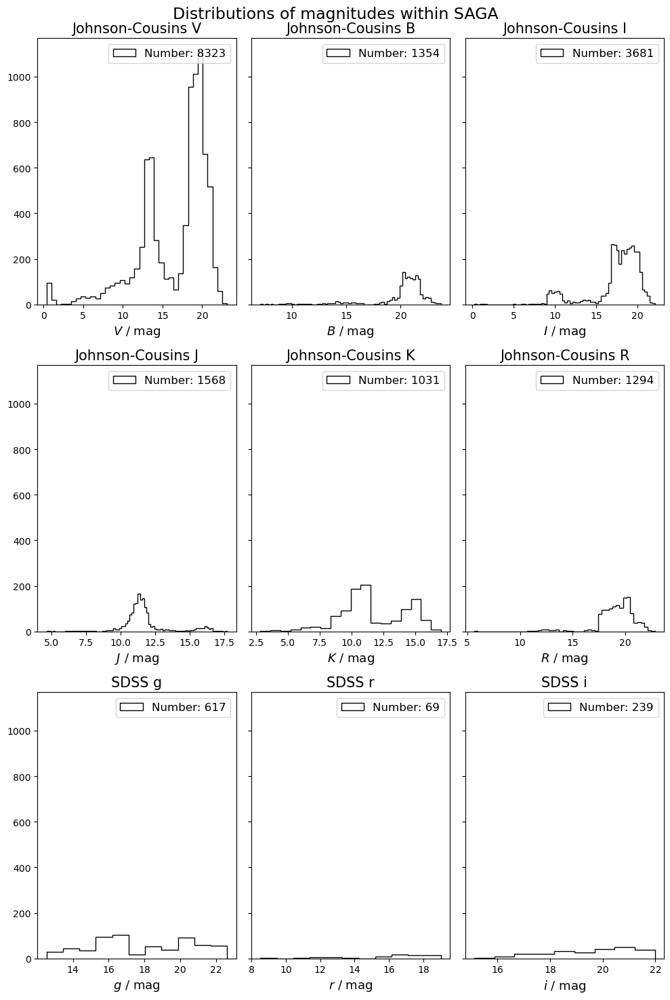

In [14]:
# number of parameters available in general
print('Total number of objects in recommended SAGA database:',len(RA))
print('Number of objects with RA value:',len(RA[np.isnan(RA)==False]),'or',round(100*len(RA[np.isnan(RA)==False])/len(RA),2),'%')
print('Number of objects with Dec value:',len(Dec[np.isnan(Dec)==False]),'or',round(100*len(Dec[np.isnan(Dec)==False])/len(RA),2),'%')
print('Number of objects with [M/H] value:',len(m_h[np.isnan(m_h)==False]),'or',round(100*len(m_h[np.isnan(m_h)==False])/len(RA),2),'%')
print('Number of objects with [Fe/H] value:',len(fe_h[np.isnan(fe_h)==False]),'or',round(100*len(fe_h[np.isnan(fe_h)==False])/len(RA),2),'%')
print('Number of objects with V magnitude value:',len(vmag[np.isnan(vmag)==False]),'or',round(100*len(vmag[np.isnan(vmag)==False])/len(RA),2),'%')
print('Number of objects with B magnitude value:',len(bmag[np.isnan(bmag)==False]),'or',round(100*len(bmag[np.isnan(bmag)==False])/len(RA),2),'%')
print('Number of objects with B-V value:',len(b_v[np.isnan(b_v)==False]),'or',round(100*len(b_v[np.isnan(b_v)==False])/len(RA),2),'%')
print('Number of objects with H magnitude value:',len(hmag[np.isnan(hmag)==False]),'or',round(100*len(hmag[np.isnan(hmag)==False])/len(RA),2),'%')
print('Number of objects with I magnitude value:',len(imag[np.isnan(imag)==False]),'or',round(100*len(imag[np.isnan(imag)==False])/len(RA),2),'%')
print('Number of objects with J magnitude value:',len(jmag[np.isnan(jmag)==False]),'or',round(100*len(jmag[np.isnan(jmag)==False])/len(RA),2),'%')
print('Number of objects with K magnitude value:',len(kmag[np.isnan(kmag)==False]),'or',round(100*len(kmag[np.isnan(kmag)==False])/len(RA),2),'%')
print('Number of objects with R magnitude value:',len(rmag[np.isnan(rmag)==False]),'or',round(100*len(rmag[np.isnan(rmag)==False])/len(RA),2),'%')
print('Number of objects with SDSS g magnitude value:',len(sdss_g[np.isnan(sdss_g)==False]),'or',round(100*len(sdss_g[np.isnan(sdss_g)==False])/len(RA),2),'%')
print('Number of objects with SDSS r magnitude value:',len(sdss_r[np.isnan(sdss_r)==False]),'or',round(100*len(sdss_r[np.isnan(sdss_r)==False])/len(RA),2),'%')
print('Number of objects with SDSS i magnitude value:',len(sdss_i[np.isnan(sdss_i)==False]),'or',round(100*len(sdss_i[np.isnan(sdss_i)==False])/len(RA),2),'%')

# do histograms
cond_vmag = (np.isnan(vmag)==False) & (vmag>0) & (vmag<26)
cond_bmag = (np.isnan(bmag)==False) & (bmag>0) & (bmag<26)
cond_imag = (np.isnan(imag)==False) & (imag>0) & (imag<26)
cond_jmag = (np.isnan(jmag)==False) & (jmag>0) & (jmag<26)
cond_kmag = (np.isnan(kmag)==False) & (kmag>0) & (kmag<26)
cond_rmag = (np.isnan(rmag)==False) & (rmag>0) & (rmag<26)
cond_sdssg = (np.isnan(sdss_g)==False)
cond_sdssr = (np.isnan(sdss_r)==False)
cond_sdssi = (np.isnan(sdss_i)==False)

# histogram of V, B, I, J, K, R, SDSS g, r, i magnitudes
fig,axs = plt.subplots(nrows=3,ncols=3,figsize=(10,15),sharey=True)
fig.suptitle('Distributions of magnitudes within SAGA',size=17)
axs[0,0].hist(vmag[cond_vmag],bins='auto',label='Number: '+str(len(vmag[cond_vmag])),histtype='step', stacked=True, fill=False,color='black')
axs[0,0].set_xlabel('$V$ / mag',size=13)
axs[0,0].set_title('Johnson-Cousins V',size=15)
axs[0,0].legend(fontsize=12)
axs[0,1].hist(bmag[cond_bmag],bins='auto',label='Number: '+str(len(bmag[cond_bmag])),histtype='step', stacked=True, fill=False,color='black')
axs[0,1].set_xlabel('$B$ / mag',size=13)
axs[0,1].set_title('Johnson-Cousins B',size=15)
axs[0,1].legend(fontsize=12)
axs[0,2].hist(imag[cond_imag],bins='auto',label='Number: '+str(len(imag[cond_imag])),histtype='step', stacked=True, fill=False,color='black')
axs[0,2].set_xlabel('$I$ / mag',size=13)
axs[0,2].set_title('Johnson-Cousins I',size=15)
axs[0,2].legend(fontsize=12)
axs[1,0].hist(jmag[cond_jmag],bins='auto',label='Number: '+str(len(jmag[cond_jmag])),histtype='step', stacked=True, fill=False,color='black')
axs[1,0].set_xlabel('$J$ / mag',size=13)
axs[1,0].set_title('Johnson-Cousins J',size=15)
axs[1,0].legend(fontsize=12)
axs[1,1].hist(kmag[cond_kmag],bins='auto',label='Number: '+str(len(kmag[cond_kmag])),histtype='step', stacked=True, fill=False,color='black')
axs[1,1].set_xlabel('$K$ / mag',size=13)
axs[1,1].set_title('Johnson-Cousins K',size=15)
axs[1,1].legend(fontsize=12)
axs[1,2].hist(rmag[cond_rmag],bins='auto',label='Number: '+str(len(rmag[cond_rmag])),histtype='step', stacked=True, fill=False,color='black')
axs[1,2].set_xlabel('$R$ / mag',size=13)
axs[1,2].set_title('Johnson-Cousins R',size=15)
axs[1,2].legend(fontsize=12)
axs[2,0].hist(sdss_g[cond_sdssg],bins='auto',label='Number: '+str(len(sdss_g[cond_sdssg])),histtype='step', stacked=True, fill=False,color='black')
axs[2,0].set_xlabel('$g$ / mag',size=13)
axs[2,0].set_title('SDSS g',size=15)
axs[2,0].legend(fontsize=12)
axs[2,1].hist(sdss_r[cond_sdssr],bins='auto',label='Number: '+str(len(sdss_r[cond_sdssr])),histtype='step', stacked=True, fill=False,color='black')
axs[2,1].set_xlabel('$r$ / mag',size=13)
axs[2,1].set_title('SDSS r',size=15)
axs[2,1].legend(fontsize=12)
axs[2,2].hist(sdss_i[cond_sdssi],bins='auto',label='Number: '+str(len(sdss_i[cond_sdssi])),histtype='step', stacked=True, fill=False,color='black')
axs[2,2].set_xlabel('$i$ / mag',size=13)
axs[2,2].set_title('SDSS i',size=15)
axs[2,2].legend(fontsize=12)
plt.tight_layout()

Number of objects with G-V colour value, first method: 3292 or 27.22%
Number of objects with G-V colour value, third method: 3760 or 31.09%

Number of objects with G magnitude value, first method: 3292 or 27.22%
Number of objects with G magnitude value, third method: 3729 or 30.83%

Number of objects with BP-RP colour value, first method: 3292 or 27.22%
Number of objects with BP-RP colour value, third method: 3760 or 31.09%

Gaia photometric information is available through at least one of the methods for 6799 objects, or 56.22%.


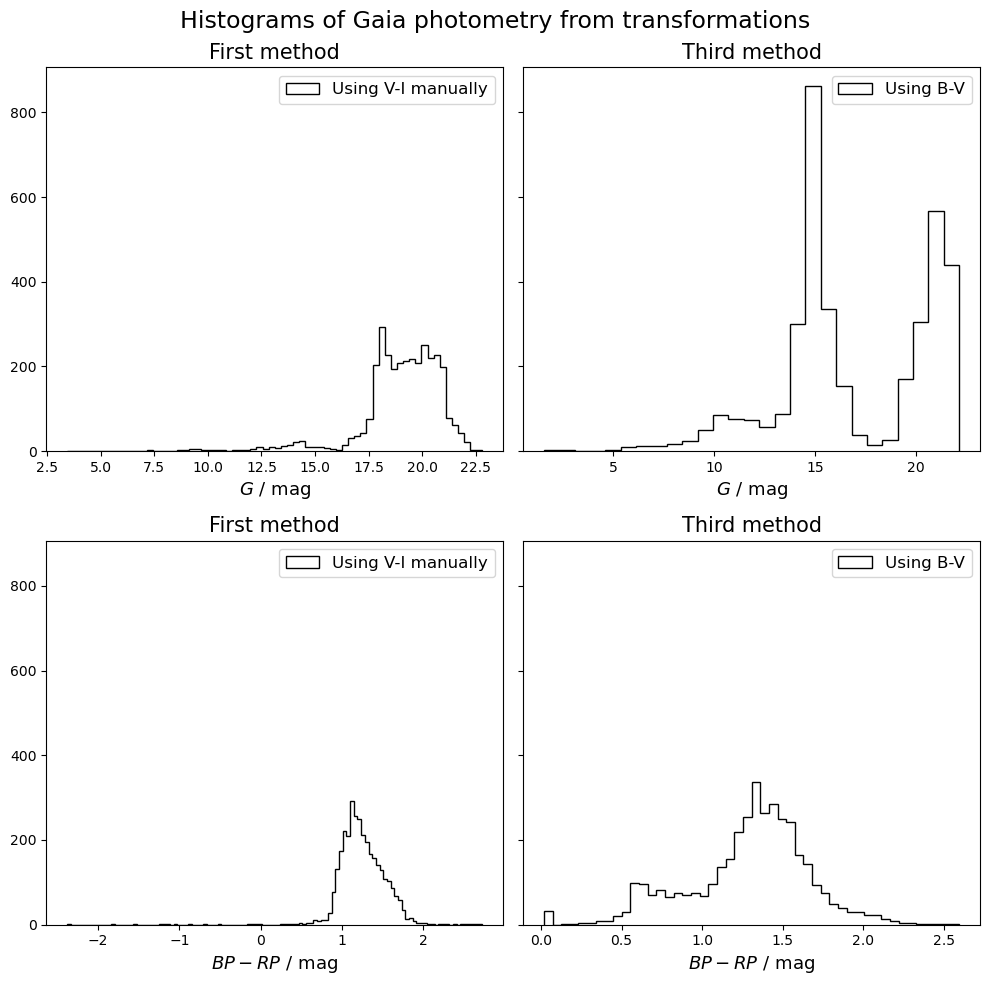

In [15]:
# get galactic coordinates
c_icrs = SkyCoord(ra=RA*u.degree, dec=Dec*u.degree, frame='icrs')
gal=c_icrs.galactic
l_gal=gal.l.degree
b_gal=gal.b.degree

# get photometric relations as no direct BP-RP available
g_v1 = -0.01597 + (-0.02809*(vmag-imag)) + (-0.2483*(vmag-imag)**2) + (0.03656*(vmag-imag)**3) + (-0.002939*(vmag-imag)**4) # G-V from calibration with V-I, subtracting it manually
g_v3 = -0.04749 + (-0.0124*b_v ) + (-0.2901*b_v++2) + (0.02008*b_v**2) # G-V from calibration with B-V
g1 = g_v1 + vmag # get G magnitude by adding V
g3 = g_v3 + vmag
bp_rp1 = -0.03298 + (1.259*(vmag-imag)) + (-0.1279*(vmag-imag)**2) + (0.01631*(vmag-imag)**3) # BP-RP from calibration with V-I, subtracting it manually
bp_rp3 = 0.0187 + (1.6814*b_v) + (-0.3357*b_v**2) + (0.1117*b_v**3)

# check numbers of objects for which these are available
print('Number of objects with G-V colour value, first method: '+str(len(RA[np.isnan(g_v1)==False]))+' or '+str(round(100*len(RA[np.isnan(g_v1)==False])/len(RA),2))+'%')
print('Number of objects with G-V colour value, third method: '+str(len(RA[np.isnan(g_v3)==False]))+' or '+str(round(100*len(RA[np.isnan(g_v3)==False])/len(RA),2))+'%\n')
print('Number of objects with G magnitude value, first method: '+str(len(RA[np.isnan(g1)==False]))+' or '+str(round(100*len(RA[np.isnan(g1)==False])/len(RA),2))+'%')
print('Number of objects with G magnitude value, third method: '+str(len(RA[np.isnan(g3)==False]))+' or '+str(round(100*len(RA[np.isnan(g3)==False])/len(RA),2))+'%\n')
print('Number of objects with BP-RP colour value, first method: '+str(len(RA[np.isnan(bp_rp1)==False]))+' or '+str(round(100*len(RA[np.isnan(bp_rp1)==False])/len(RA),2))+'%')
print('Number of objects with BP-RP colour value, third method: '+str(len(RA[np.isnan(bp_rp3)==False]))+' or '+str(round(100*len(RA[np.isnan(bp_rp3)==False])/len(RA),2))+'%\n')

# how many star have either B-V, or (V and I)?
numcolinf=len(RA[(np.isnan(b_v)==False) & (np.isnan(vmag)==False)])+len(RA[(np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True)])
print('Gaia photometric information is available through at least one of the methods for '+str(numcolinf)+' objects, or '+str(round(100*numcolinf/len(RA),2))+'%.')

# do histograms of the computed photometry to get general distribution
# there are some unphysical outliers: ignored
fig,axs = plt.subplots(nrows=2,ncols=2,figsize=(10,10),sharey=True)
fig.suptitle('Histograms of Gaia photometry from transformations',size=17)
axs[0,0].hist(g1[(np.isnan(g1)==False) & (g1>0)],bins='auto',label='Using V-I manually',histtype='step', stacked=True, fill=False,color='black')
axs[0,0].set_xlabel('$G$ / mag',size=13)
axs[0,0].set_title('First method',size=15)
axs[0,0].legend(fontsize=12)
axs[0,1].hist(g3[(np.isnan(g3)==False) & (g3>0)],bins='auto',label='Using B-V',histtype='step', stacked=True, fill=False,color='black')
axs[0,1].set_xlabel('$G$ / mag',size=13)
axs[0,1].set_title('Third method',size=15)
axs[0,1].legend(fontsize=12)
axs[1,0].hist(bp_rp1[(np.isnan(bp_rp1)==False) & (bp_rp1>-10) & (bp_rp1<3)],bins='auto',label='Using V-I manually',histtype='step', stacked=True, fill=False,color='black')
axs[1,0].set_xlabel('$BP-RP$ / mag',size=13)
axs[1,0].set_title('First method',size=15)
axs[1,0].legend(fontsize=12)
axs[1,1].hist(bp_rp3[(np.isnan(bp_rp3)==False) & (bp_rp3>-10) & (bp_rp3<3)],bins='auto',label='Using B-V',histtype='step', stacked=True, fill=False,color='black')
axs[1,1].set_xlabel('$BP-RP$ / mag',size=13)
axs[1,1].set_title('Third method',size=15)
axs[1,1].legend(fontsize=12)
plt.tight_layout()

In [16]:
# now stepwise application of the selection criteria
################################################################################
#first starting with all objects in table (a bit irrelevant because many don't have the required parameters so cannot say from this how many drop out because of what)
# start with coordinates

# for quick change of upper Dec limit define as variable
dec_u=20
print('Overall, only '+str(len(RA[np.isnan(RA)==False]))+' (RA,Dec) pairs are available, or '+str(round(100*len(RA[np.isnan(RA)==False])/len(RA),2))+'%.')
print('Applying the range [-80,+'+str(dec_u)+'] to Dec leaves '+str(len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80)]))+' objects, or '+str(round(100*len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80)])/len(RA),2))+'%.')
print('Applying the range |b|>20 to the galactic coordinates leaves '+str(len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20)]))+' objects, or '+str(round(100*len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20)])/len(RA),2))+'%.\n')

# now photometric criteria, starting with apparent magnitude
b_v_det=len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False) & (g3<=17) & (g3>=12)])
v_i_mandet=len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True) & (g1<=17) & (g1>=12)])
print('Of the objects left from above, '+str(len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False)])+len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True)]))+' objects, or '+str(round(100*(len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False)])+len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True)]))/len(RA),2))+'% of the total have a value for G.')
print('Applying the selection criterium 12<=G<=17 leaves '+str(b_v_det+v_i_mandet)+' objects, or '+str(round(100*(b_v_det+v_i_mandet)/len(RA),2))+'% of all objects.')

# ...and then colour
b_v_detc=len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False) & (g3<=17) & (g3>=12) & (bp_rp3<=1.6) & (bp_rp3>=0.15)])
v_i_mandetc=len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True) & (g1<=17) & (g1>=12) & (bp_rp1<=1.6) & (bp_rp1>=0.15)])
print('Applying the selecion criterium 0.15<=BP-RP<=1.6 leaves '+str(b_v_detc+v_i_mandetc)+' objects, or '+str(round(100*(b_v_detc+v_i_mandetc)/len(RA),2))+'% of all objects.\n')

#finally apply metallicity cut
b_v_detc_feh=len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False) & (g3<=17) & (g3>=12) & (bp_rp3<=1.6) & (bp_rp3>=0.15) & (np.isnan(fe_h)==False) & (fe_h<-0.4)])
v_i_mandetc_feh=len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True) & (g1<=17) & (g1>=12) & (bp_rp1<=1.6) & (bp_rp1>=0.15) & (np.isnan(fe_h)==False) & (fe_h<-0.4)])
print('Of the objects left from above, '+str(len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False) & (g3<=17) & (g3>=12) & (bp_rp3<=1.6) & (bp_rp3>=0.15) & (np.isnan(fe_h)==False)])+len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True) & (g1<=17) & (g1>=12) & (bp_rp1<=1.6) & (bp_rp1>=0.15) & (np.isnan(fe_h)==False)]))+' objects, or '+str(round(100*(len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False) & (g3<=17) & (g3>=12) & (bp_rp3<=1.6) & (bp_rp3>=0.15) & (np.isnan(fe_h)==False)])+len(RA[(np.isnan(RA)==False) & (Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True) & (g1<=17) & (g1>=12) & (bp_rp1<=1.6) & (bp_rp1>=0.15) & (np.isnan(fe_h)==False)]))/len(RA),2))+'% of the total have a value for [Fe/H].')
print('Applying the selecion criterium [Fe/H]<-0.4 leaves '+str(b_v_detc_feh+v_i_mandetc_feh)+' objects, or '+str(round(100*(b_v_detc_feh+v_i_mandetc_feh)/len(RA),2))+'% of all objects.')
#################################################################################

# more interesting perhaps is to determine fractions of objects left relative to all objects that actually have the relevant information available
print('\n\nRelative to number of objects where relevant parameters are available:')
gen1=(np.isnan(fe_h)==False) & (np.isnan(RA)==False) & (np.isnan(vmag)==False) & (np.isnan(imag)==False) & (np.isnan(b_v)==True)
gen3=(np.isnan(fe_h)==False) & (np.isnan(RA)==False) & (np.isnan(b_v)==False) & (np.isnan(vmag)==False)

num3=len(RA[gen3])
num1=len(RA[gen1])
numtot=num1+num3
print('The number of objects for which both position and Gaia photometry are available is '+str(numtot)+' (which corresponds to '+str(round(100*numtot/len(RA),2))+'% of the recommended SAGA sample).')

# for quick change of upper Dec limit define as variable
dec_u=20
astrom1=(Dec<=dec_u) & (Dec>=-80)
nastr1=len(RA[gen1 & astrom1])+len(RA[gen3 & astrom1])
print('After application of criterium -80° <= Dec <= 20°, '+str(nastr1)+' objects are left, which is '+str(round(100*nastr1/numtot,2))+'%.')
astrom2=(Dec<=dec_u) & (Dec>=-80) & (np.abs(b_gal)>20)
nastr2=len(RA[gen1 & astrom1 & astrom2])+len(RA[gen3 & astrom1 & astrom2])
print('After application of criterium |b|>20°, '+str(nastr2)+' objects are left, which is '+str(round(100*nastr2/numtot,2))+'%.')

magn1=(g1<=17) & (g1>=12)
magn3=(g3<=17) & (g3>=12)
magn=len(RA[gen1 & astrom1 & astrom2 & magn1])+len(RA[gen3 & astrom1 & astrom2 & magn3])
print('After application of criterium 12 <= G <= 18, '+str(magn)+' objects are left, which is '+str(round(100*magn/numtot,2))+'%.')

col1=(bp_rp1<=1.6) & (bp_rp1>=0.15)
col3=(bp_rp3<=1.6) & (bp_rp3>=0.15)
col=len(RA[gen1 & astrom1 & astrom2 & magn1 & col1])+len(RA[gen3 & astrom1 & astrom2 & magn3 & col3])
print('After application of criterium 0.15 <= BP-RP <= 1.6, '+str(col)+' objects are left, which is '+str(round(100*col/numtot,2))+'%.')

fehnum=len(RA[gen1 & astrom1 & astrom2 & magn1 & col1 & (fe_h<-0.4)])+len(RA[gen3 & astrom1 & astrom2 & magn3 & col3 & (fe_h<-0.4)])
print('After application of criterium [Fe/H] < -0.4, '+str(fehnum)+' objects are left, which is '+str(round(100*fehnum/numtot,2))+'%.')

# quick calculation to estimate how many crossmatches I should expect from 4MOST input with SAGA
print('From this, I would expect the number of crossmatched objects to be '+str(int((fehnum/numtot)*len(RA)))+'.')

Overall, only 11630 (RA,Dec) pairs are available, or 96.16%.
Applying the range [-80,+20] to Dec leaves 9441 objects, or 78.06%.
Applying the range |b|>20 to the galactic coordinates leaves 8575 objects, or 70.9%.

Of the objects left from above, 4987 objects, or 41.24% of the total have a value for G.
Applying the selection criterium 12<=G<=17 leaves 1392 objects, or 11.51% of all objects.
Applying the selecion criterium 0.15<=BP-RP<=1.6 leaves 1272 objects, or 10.52% of all objects.

Of the objects left from above, 656 objects, or 5.42% of the total have a value for [Fe/H].
Applying the selecion criterium [Fe/H]<-0.4 leaves 623 objects, or 5.15% of all objects.


Relative to number of objects where relevant parameters are available:
The number of objects for which both position and Gaia photometry are available is 5582 (which corresponds to 46.16% of the recommended SAGA sample).
After application of criterium -80° <= Dec <= 20°, 4249 objects are left, which is 76.12%.
After applicat

# 4.4. Compare spatial distribution to Besancon model

In [17]:
# load Besancon model output and apply additional conditions of our survey
bes_path='data/besancon_dec_sm20_wo_err.fits'

bes_hdul = fits.open(bes_path,memmap=True)
besancon = Table(bes_hdul[1].data)
bes_hdul.close()
besancon

G,G-V,J-K,mux,muy,HRV,UU,VV,WW,Mv,Teff,logg,[M/H],longitude,latitude,RAJ2000,DECJ2000,Dist,x_Gal,y_Gal,z_Gal,Av
float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float64,float32,float32,float32,float32,float32
16.199,0.724,0.82,-4.538,-26.143,2.37,13.23,-12.39,-3.07,9.78,3726.0,4.91,-0.112,8.91033,-86.150764,8.853456,-28.638172,0.1344,-7.9911,0.0014,-0.1191,0.071
12.909,0.288,0.696,-22.314,27.496,-0.48,4.0,22.65,2.03,6.91,4575.0,4.71,-0.365,3.456842,-85.218697,8.08189,-29.399649,0.1349,-7.9888,0.0007,-0.1194,0.076
12.307,0.238,0.587,-8.969,-7.385,1.45,6.33,-1.22,1.63,6.37,4749.0,4.74,-0.057,2.441819,-85.087891,7.994627,-29.536371,0.1346,-7.9885,0.0005,-0.1191,0.064
12.132,0.212,0.592,2.542,-16.133,-11.06,4.44,-9.0,11.96,6.32,4861.0,4.68,-0.109,0.327279,-88.79277,11.710168,-27.774071,0.1271,-7.9973,0.0,-0.112,0.068
12.005,0.197,0.543,-8.631,-34.469,5.3,15.26,-15.78,-2.11,6.16,4911.0,4.85,-0.285,1.917722,-88.304878,11.214378,-27.992058,0.1285,-7.9962,1e-04,-0.1134,0.062
16.428,0.645,0.76,89.807,-45.588,41.83,-28.24,-49.13,-42.56,10.28,3862.0,4.99,-0.987,0.3584,-86.98864,9.966065,-28.719757,0.122,-7.9936,0.0,-0.1068,0.059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16.908,0.252,0.591,-1.759,-1.694,24.6,-20.08,-157.65,25.44,0.91,5031.0,2.24,-1.469,351.861206,75.633064,204.155914,17.255796,13.9459,-4.5744,-0.4899,13.5248,0.07
14.786,0.305,0.658,-2.811,-3.352,93.19,22.05,-368.69,84.93,-1.46,4358.0,1.17,-1.376,355.044006,77.144791,203.551743,18.841547,14.6084,-4.762,-0.2808,14.2573,0.068


In [18]:
besancon = besancon[(besancon['DECJ2000']<=5) & (besancon['DECJ2000']>=-80) & (besancon['[M/H]']<-0.4) & (np.abs(besancon['latitude'])>20)]
dist_bes = besancon['Dist'] # in kpc
G_bes = besancon['G'] # in mag
j_k_bes = besancon['J-K'] # in mag

# now use https://gea.esac.esa.int/archive/documentation/GEDR3/Data_processing/chap_cu5pho/cu5pho_sec_photSystem/cu5pho_ssec_photRelations.html
bp_rp_bes = 0.09396 + 2.581*j_k_bes - 2.782*j_k_bes**2 + 2.788*j_k_bes**3 - 0.8027*j_k_bes**4
M_G_bes = G_bes + 5 - 5*np.log10(dist_bes*1000)

# apply cuts in colour and absolute magnitude
besancon = besancon[np.logical_or((bp_rp_bes >= 0.15) & (bp_rp_bes <= 1.1),(bp_rp_bes > 1.1) & (bp_rp_bes <= 1.6) & (M_G_bes < 3.5))]

l_bes = besancon['longitude'] # in deg
b_bes = besancon['latitude'] # in deg
dist_bes = besancon['Dist'] # in kpc
G_bes = besancon['G'] # in mag
j_k_bes = besancon['J-K'] # in mag
teff_bes = besancon['Teff'] # in K

bp_rp_bes = 0.09396 + 2.581*j_k_bes - 2.782*j_k_bes**2 + 2.788*j_k_bes**3 - 0.8027*j_k_bes**4
M_G_bes = G_bes + 5 - 5*np.log10(dist_bes*1000)

# calculate the G band extinctions from Gaia TGE dust map to make actual selection
coords = coord.SkyCoord(l_bes*u.deg, b_bes*u.deg, frame='galactic')
tge = GaiaTGEQuery()
A0 = tge(coords)

A_G=np.empty(shape=(len(A0)))

# using T_eff for MS
a1=0.259021858973784
a2=0.93676111876298
a3=-0.437446499585492
a4=0.0783508476444952
a5=-0.00136127433235224
a6=0.000797222688660053
a7=-2.52364537395233e-05
a8=-0.029981504413869
a9=0.00555506017434798
a10=0.000402778419603886

X = teff_bes[(M_G_bes>5)==True]/5040
k_G = a1+a2*X+a3*X**2+a4*X**3+a5*A0[(M_G_bes>5)==True]+a6*A0[(M_G_bes>5)==True]**2+a7*A0[(M_G_bes>5)==True]**3+a8*A0[(M_G_bes>5)==True]*X+a9*A0[(M_G_bes>5)==True]*X**2+a10*X*A0[(M_G_bes>5)==True]**2
A_G[(M_G_bes>5)] = k_G*A0[(M_G_bes>5)]

# using T_eff for HRD top
a1=0.235975767531247
a2=0.974642001154732
a3=-0.454849105677279
a4=0.0809472883012553
a5=0.00143267173083805
a6=0.000711522982426832
a7=-2.43558666819971e-05
a8=-0.0330300302504699
a9=0.00626996185287723
a10=0.000448105647489681

X = teff_bes[(M_G_bes>5)==False]/5040
k_G = a1+a2*X+a3*X**2+a4*X**3+a5*A0[(M_G_bes>5)==False]+a6*A0[(M_G_bes>5)==False]**2+a7*A0[(M_G_bes>5)==False]**3+a8*A0[(M_G_bes>5)==False]*X+a9*A0[(M_G_bes>5)==False]*X**2+a10*X*A0[(M_G_bes>5)==False]**2
A_G[(M_G_bes>5)==False] = k_G*A0[(M_G_bes>5)==False]

# now calculate actual observed apparent magnitudes G_act = G + A_G and remove all objects G_act>17mag
besancon = besancon[G_bes + A_G < 17]

# define all new
ra_bes = besancon['RAJ2000'] # in deg; NOTE: J2000
dec_bes = besancon['DECJ2000'] # in deg; NOTE: J2000
l_bes = besancon['longitude'] # in deg
b_bes = besancon['latitude'] # in deg
x_gal_bes = besancon['x_Gal'] # in kpc
y_gal_bes = besancon['y_Gal'] # in kpc
z_gal_bes = besancon['z_Gal'] # in kpc
m_h_bes = besancon['[M/H]'] # in dex
dist_bes = besancon['Dist'] # in kpc
G_bes = besancon['G'] # in mag
j_k_bes = besancon['J-K'] # in mag
teff_bes = besancon['Teff'] # in K

besancon=[] # free up RAM space

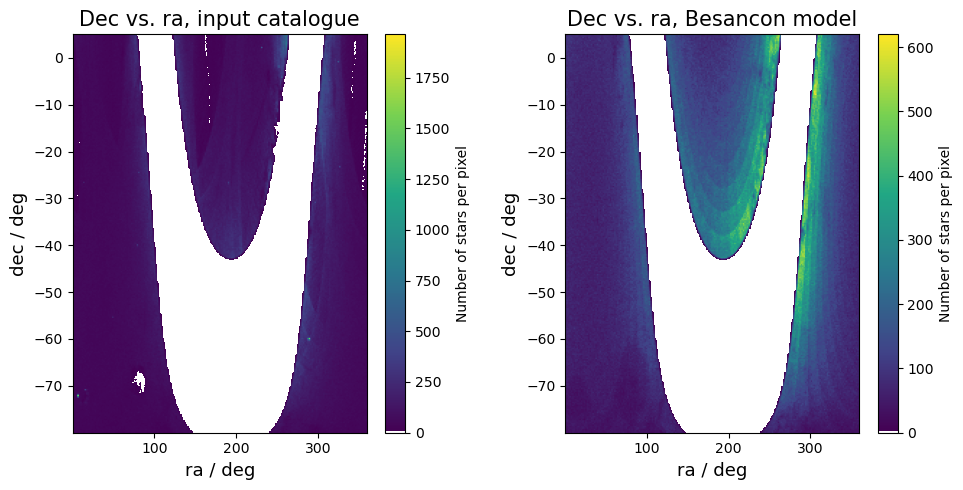

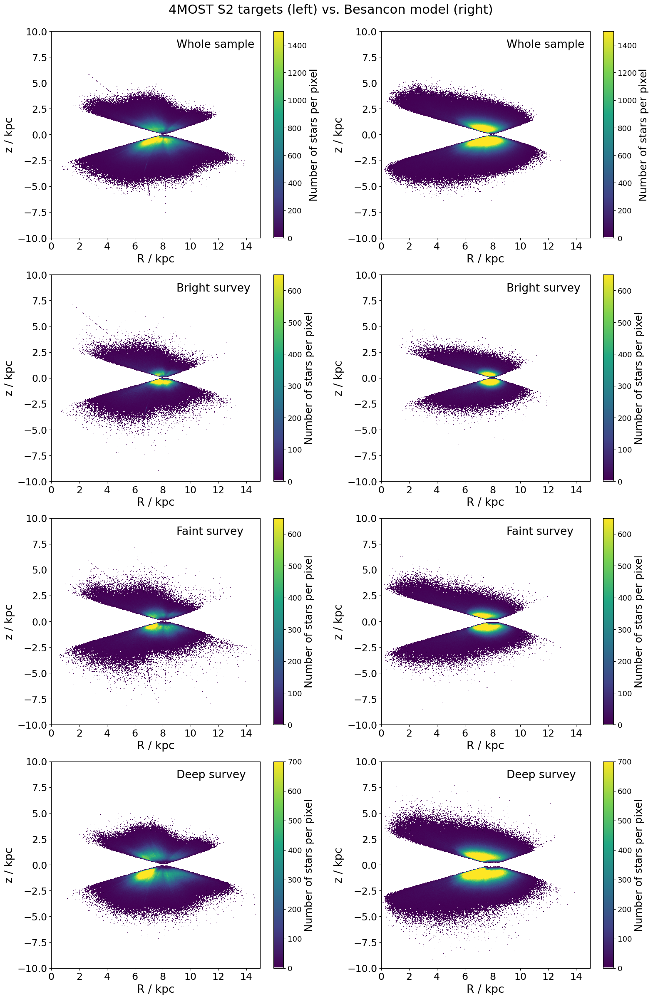

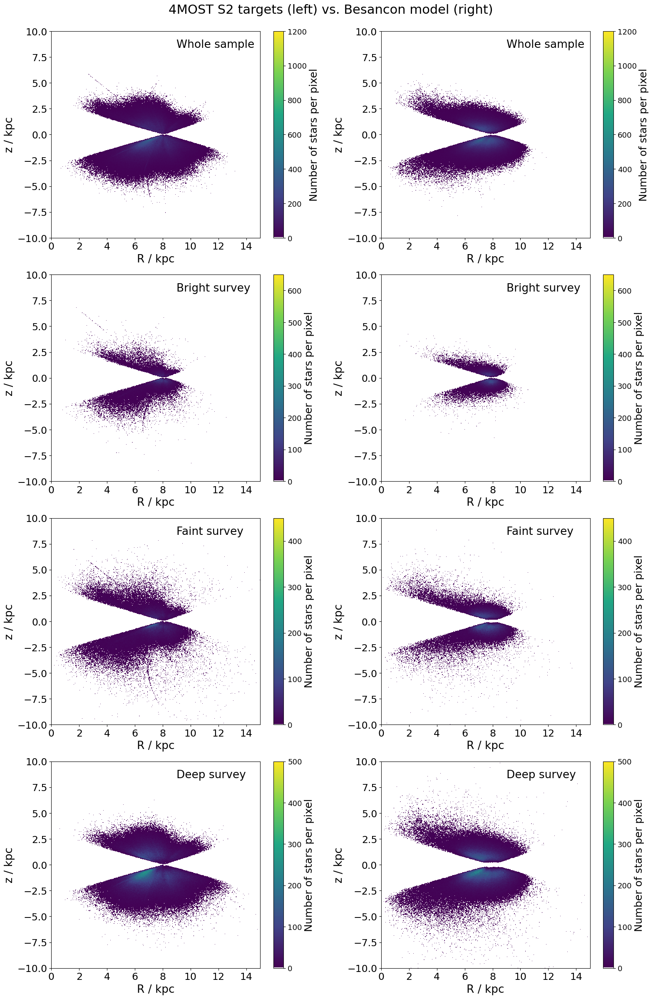

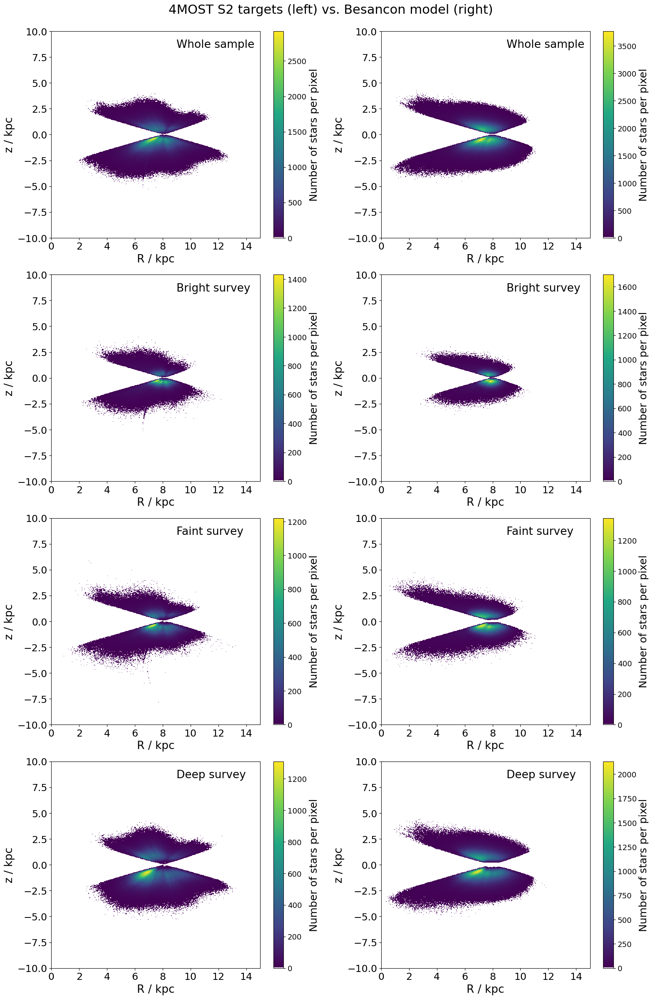

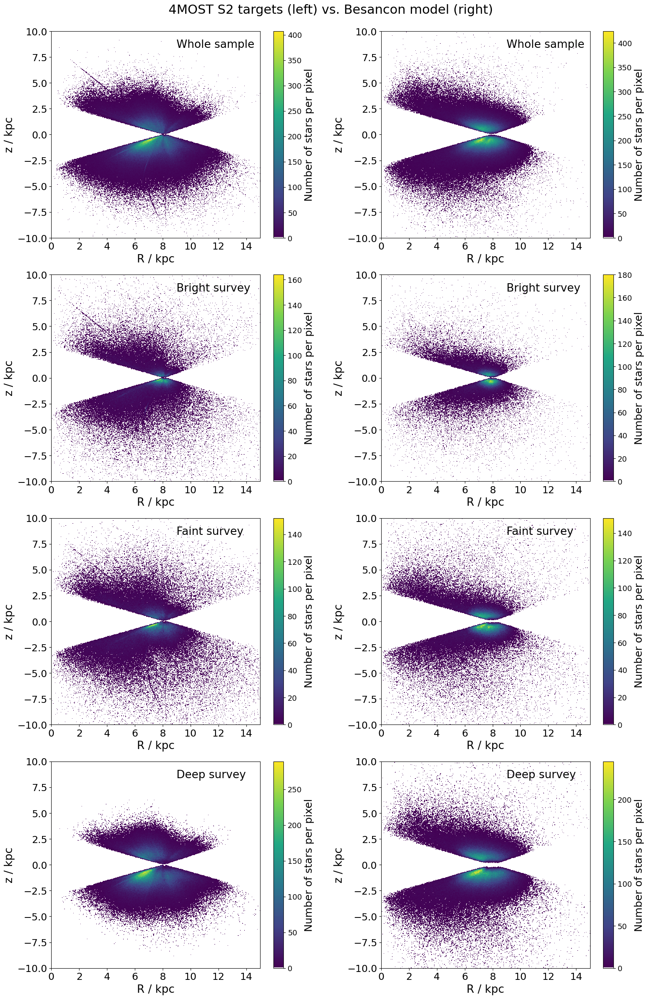

In [19]:
# colour transformation from Gaia DR3 Documentation Chapter 5.5.1.
bp_rp_bes = 0.09396 + 2.581*j_k_bes - 2.782*j_k_bes**2 + 2.788*j_k_bes**3 - 0.8027*j_k_bes**4
M_G_bes = G_bes + 5 - 5*np.log10(dist_bes*1000)

# first I plot dec against ra just to have a look
radec=plt.figure(figsize=(10,5))
ax = radec.add_subplot(1, 2, 1, projection='scatter_density')
density = ax.scatter_density(ra,dec, cmap=white_viridis)
radec.colorbar(density, label='Number of stars per pixel')
plt.xlabel('ra / deg',size=13)
plt.ylabel('dec / deg',size=13)
plt.title('Dec vs. ra, input catalogue',size=15)
ax = radec.add_subplot(1, 2, 2, projection='scatter_density')
density = ax.scatter_density(ra_bes,dec_bes, cmap=white_viridis)
radec.colorbar(density, label='Number of stars per pixel')
plt.xlabel('ra / deg',size=13)
plt.ylabel('dec / deg',size=13)
plt.title('Dec vs. ra, Besancon model',size=15)
plt.tight_layout()
plt.savefig('figures/4_10_dec_vs_ra.png',format='png')

#########################
#### input catalogue ####
#########################
Gmag = Gmag_bes
parallax0 = parallax0_bes
parallax_e = parallax_e_bes
fe_h = fe_h_bes

# define conditions for better readability
bright = (Gmag<=14.5)
faint = (Gmag>14.5) & (Gmag<=15.5)
deepall = (Gmag>15.5)
no_paral=(np.isnan(parallax0)==True)
paral_bet3 = (parallax0 >= 3*parallax_e)
paral_wor3 = (parallax0 < 3*parallax_e)

# now find out distances, use same criteria as for CMDs
dist = np.empty(shape=(len(source_id)))
dist[paral_bet3] = 1000/parallax0[paral_bet3]
dist[no_paral] = np.nan
dist[paral_wor3] = np.nan
#dist[paral_wor3 & (phot_dist>10*phot_dist_e)] = phot_dist[paral_wor3 & (phot_dist>10*phot_dist_e)]

# load ICRS coordinates, transform to cartesian galactocentric coordinates, then calculate R the distance parallel to the disk from the centre
r_gc_sun=np.array([8122,0,20.8])*u.pc
v_gc_sun=np.array([11.1,12.24+232.8,7.25])*u.km/u.s
c_icrs = coord.SkyCoord(ra=ra*u.degree,dec=dec*u.degree,distance=dist*u.pc,frame='icrs')
gc_frame = coord.Galactocentric(galcen_distance=r_gc_sun[0],galcen_v_sun=v_gc_sun,z_sun=r_gc_sun[2])
gc_cart = c_icrs.transform_to(gc_frame)
R = np.sqrt(gc_cart.x**2+gc_cart.y**2)/1000 # in kpc
z = gc_cart.z/1000 # in kpc

nan_R_z_G = (np.isnan(Gmag)==False) & (np.isnan(R) == False) & (np.isnan(z) == False)

# do the spatial distribution plots again only for objects below a certain metallicity
# first find out distances, use same criteria as for CMDs
met_cut=-1.0
cond_met = fe_h < met_cut

########################
#### Besancon model ####
########################

bright_bes = (G_bes <=14.5)
faint_bes = (G_bes > 14.5) & (G_bes <= 15.5)
deep_bes = (G_bes > 15.5)
cond_met_bes = (m_h_bes < met_cut)

R_bes = np.sqrt(x_gal_bes**2+y_gal_bes**2)
z_bes = z_gal_bes

# finally plot it all
def spat_distr(fig,pos,R,z,v_max,sub):
    ax = fig.add_subplot(4, 2, pos, projection='scatter_density')
    density = ax.scatter_density(np.array(R),np.array(z), cmap=white_viridis,vmax=v_max)
    cb=fig.colorbar(density)
    cb.set_label(label='Number of stars per pixel',size=18)
    cb.ax.tick_params(labelsize=13)    
    plt.xlabel('R / kpc',size=19)
    plt.ylabel('z / kpc',size=19)
    plt.xticks(size=17)
    plt.yticks(size=17)
    plt.xlim(0,15)
    plt.ylim(-10,10)
    plt.annotate(sub,size=19,xy=(0.6, 0.92), xycoords='axes fraction')
    plt.tight_layout()

fig1=plt.figure(figsize=(16,24))
fig1.suptitle('4MOST S2 targets (left) vs. Besancon model (right)',size=22,y=0.999)
spat_distr(fig1,1,R[nan_R_z_G],z[nan_R_z_G],1500,'Whole sample')
spat_distr(fig1,3,R[bright & nan_R_z_G],z[bright & nan_R_z_G],650,'Bright survey')
spat_distr(fig1,5,R[faint & nan_R_z_G],z[faint & nan_R_z_G],650,'Faint survey')
spat_distr(fig1,7,R[deepall & nan_R_z_G],z[deepall & nan_R_z_G],700,'Deep survey')
spat_distr(fig1,2,R_bes,z_bes,1500,'Whole sample')
spat_distr(fig1,4,R_bes[bright_bes],z_bes[bright_bes],650,'Bright survey')
spat_distr(fig1,6,R_bes[faint_bes],z_bes[faint_bes],650,'Faint survey')
spat_distr(fig1,8,R_bes[deep_bes],z_bes[deep_bes],700,'Deep survey')
plt.savefig('figures/4_11c_spat_distr_vs_bes_model_col.png',format='png')

fig2=plt.figure(figsize=(16,24))
fig2.suptitle('4MOST S2 targets (left) vs. Besancon model (right)',size=22,y=0.999)
spat_distr(fig2,1,R[nan_R_z_G & cond_met],z[nan_R_z_G & cond_met],1200,'Whole sample')
spat_distr(fig2,3,R[bright & nan_R_z_G & cond_met],z[bright & nan_R_z_G & cond_met],650,'Bright survey')
spat_distr(fig2,5,R[faint & nan_R_z_G & cond_met],z[faint & nan_R_z_G & cond_met],450,'Faint survey')
spat_distr(fig2,7,R[deepall & nan_R_z_G & cond_met],z[deepall & nan_R_z_G & cond_met],500,'Deep survey')
spat_distr(fig2,2,R_bes[cond_met_bes],z_bes[cond_met_bes],1200,'Whole sample')
spat_distr(fig2,4,R_bes[bright_bes & cond_met_bes],z_bes[bright_bes & cond_met_bes],650,'Bright survey')
spat_distr(fig2,6,R_bes[faint_bes & cond_met_bes],z_bes[faint_bes & cond_met_bes],450,'Faint survey')
spat_distr(fig2,8,R_bes[deep_bes & cond_met_bes],z_bes[deep_bes & cond_met_bes],500,'Deep survey')
plt.savefig('figures/4_11d_spat_distr_vs_bes_model_col_metcut_min1.png',format='png')

# adjust colorbars to show that structures do look similar when saturation effects do not obscure it
def spat_distr2(fig,pos,R,z,sub):
    ax = fig.add_subplot(4, 2, pos, projection='scatter_density')
    density = ax.scatter_density(np.array(R),np.array(z), cmap=white_viridis)
    cb=fig.colorbar(density)
    cb.set_label(label='Number of stars per pixel',size=18)
    cb.ax.tick_params(labelsize=13)  
    plt.xlabel('R / kpc',size=19)
    plt.ylabel('z / kpc',size=19)
    plt.xticks(size=17)
    plt.yticks(size=17)
    plt.xlim(0,15)
    plt.ylim(-10,10)
    plt.annotate(sub,size=19,xy=(0.6, 0.92), xycoords='axes fraction')
    plt.tight_layout()

fig1=plt.figure(figsize=(16,24))
fig1.suptitle('4MOST S2 targets (left) vs. Besancon model (right)',size=22,y=0.999)
spat_distr2(fig1,1,R[nan_R_z_G],z[nan_R_z_G],'Whole sample')
spat_distr2(fig1,3,R[bright & nan_R_z_G],z[bright & nan_R_z_G],'Bright survey')
spat_distr2(fig1,5,R[faint & nan_R_z_G],z[faint & nan_R_z_G],'Faint survey')
spat_distr2(fig1,7,R[deepall & nan_R_z_G],z[deepall & nan_R_z_G],'Deep survey')
spat_distr2(fig1,2,R_bes,z_bes,'Whole sample')
spat_distr2(fig1,4,R_bes[bright_bes],z_bes[bright_bes],'Bright survey')
spat_distr2(fig1,6,R_bes[faint_bes],z_bes[faint_bes],'Faint survey')
spat_distr2(fig1,8,R_bes[deep_bes],z_bes[deep_bes],'Deep survey')
plt.savefig('figures/4_11a_spat_distr_vs_bes_model.png',format='png')

fig2=plt.figure(figsize=(16,24))
fig2.suptitle('4MOST S2 targets (left) vs. Besancon model (right)',size=22,y=0.999)
spat_distr2(fig2,1,R[nan_R_z_G & cond_met],z[nan_R_z_G & cond_met],'Whole sample')
spat_distr2(fig2,3,R[bright & nan_R_z_G & cond_met],z[bright & nan_R_z_G & cond_met],'Bright survey')
spat_distr2(fig2,5,R[faint & nan_R_z_G & cond_met],z[faint & nan_R_z_G & cond_met],'Faint survey')
spat_distr2(fig2,7,R[deepall & nan_R_z_G & cond_met],z[deepall & nan_R_z_G & cond_met],'Deep survey')
spat_distr2(fig2,2,R_bes[cond_met_bes],z_bes[cond_met_bes],'Whole sample')
spat_distr2(fig2,4,R_bes[bright_bes & cond_met_bes],z_bes[bright_bes & cond_met_bes],'Bright survey')
spat_distr2(fig2,6,R_bes[faint_bes & cond_met_bes],z_bes[faint_bes & cond_met_bes],'Faint survey')
spat_distr2(fig2,8,R_bes[deep_bes & cond_met_bes],z_bes[deep_bes & cond_met_bes],'Deep survey')
plt.savefig('figures/4_11b_spat_distr_vs_bes_model_metcut_min1.png',format='png')

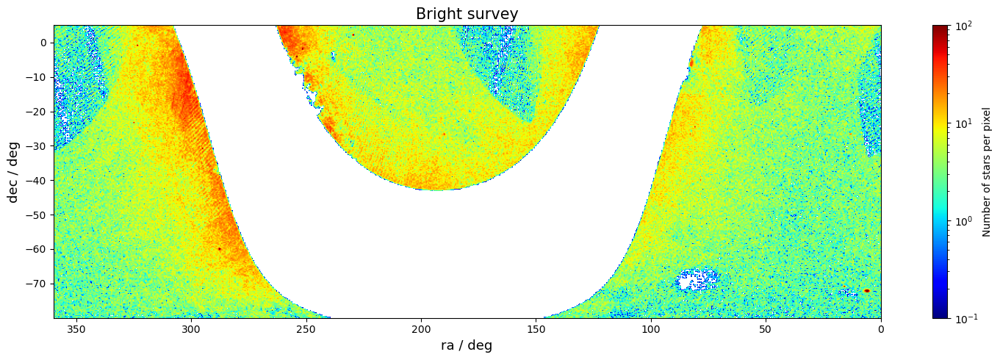

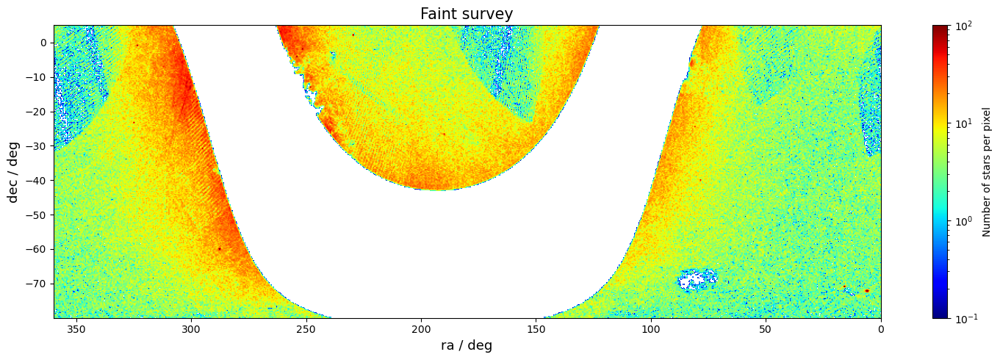

In [20]:
# Gaia scanning law effects
radecb=plt.figure(figsize=(15,5))
ax = radecb.add_subplot(1, 1, 1, projection='scatter_density')
cmap = plt.cm.get_cmap("jet").copy()
cmap.set_under(color='white')
density = ax.scatter_density(ra[bright],dec[bright], cmap=cmap,norm=mplcol.LogNorm(vmin=0.1,vmax=100))
radecb.colorbar(density, label='Number of stars per pixel')
plt.xlabel('ra / deg',size=13)
plt.ylabel('dec / deg',size=13)
plt.xlim(360,0)
plt.title('Bright survey',size=15)
plt.tight_layout()

radecf=plt.figure(figsize=(15,5))
ax = radecf.add_subplot(1, 1, 1, projection='scatter_density')
density = ax.scatter_density(ra[faint],dec[faint], cmap=cmap,norm=mplcol.LogNorm(vmin=0.1,vmax=100))
radecf.colorbar(density, label='Number of stars per pixel')
plt.xlabel('ra / deg',size=13)
plt.ylabel('dec / deg',size=13)
plt.xlim(360,0)
plt.title('Faint survey',size=15)
plt.tight_layout()

The number of objects in our sample (dec<5°, [Fe/H]<-0.4) is 3809536
The number of objects for this in the Besancon model is 5113611
The number of stars that are above z=3kpc/below z=-3kpc in the target catalogue is 162305
The number of stars that are above z=3kpc/below z=-3kpc in the Besancon model is 194316
The number of stars that are below [Fe/H]=-1.0 in the target catalogue is 959819
The number of stars that are below [M/H]=-1.0 in the Besancon model is 718115


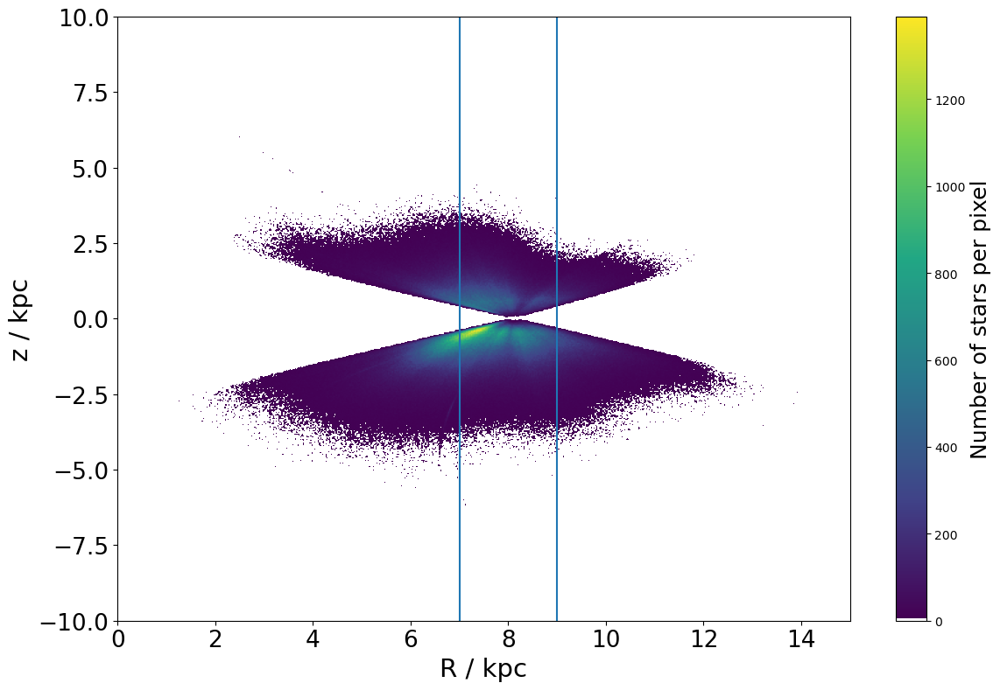

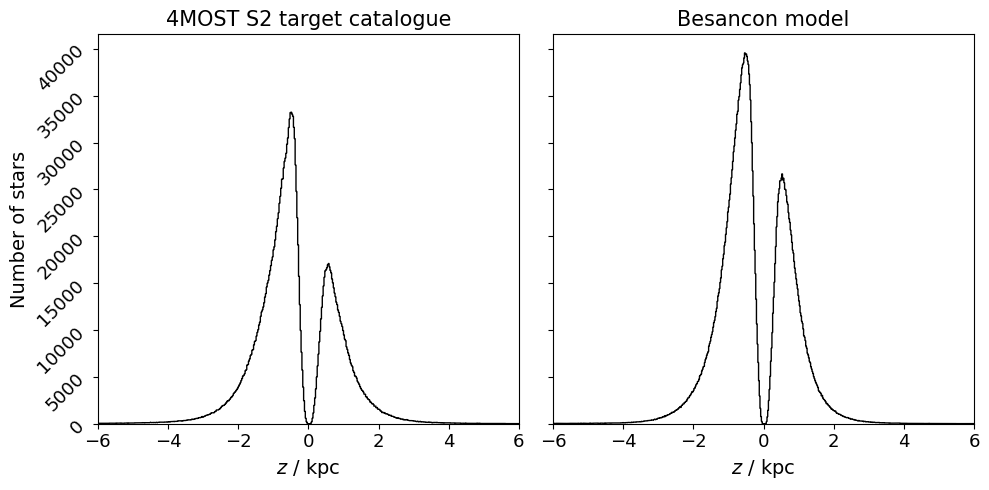

In [21]:
# quantitative comparison
# what are the numbers?
print('The number of objects in our sample (dec<5°, [Fe/H]<-0.4) is',len(source_id))
print('The number of objects for this in the Besancon model is',len(ra_bes))

# also wanna know: how many objects are above/below z=2.5kpc/z=-2.5kpc (more pure halo sample, altho some thick disk remains)
print('The number of stars that are above z=3kpc/below z=-3kpc in the target catalogue is',len(R[np.array(z)<-3])+len(R[np.array(z)>3]))
print('The number of stars that are above z=3kpc/below z=-3kpc in the Besancon model is',len(R_bes[np.array(z_bes)<-3])+len(R_bes[np.array(z_bes)>3]))

# also wanna know: how many objects are above/below z=2.5kpc/z=-2.5kpc (more pure halo sample, altho some thick disk remains)
print('The number of stars that are below [Fe/H]=-1.0 in the target catalogue is',len(R[fe_h<-1]))
print('The number of stars that are below [M/H]=-1.0 in the Besancon model is',len(R_bes[m_h_bes<-1]))

# compare histogram of z values for range R in [7,9]kpc
vert_cut = (np.array(R)>7) & (np.array(R)<9)
vert_cut_bes = (np.array(R_bes)>7) & (np.array(R_bes)<9)

# Spatial distribution in galactocentric coordinates
fig1=plt.figure(figsize=(12,8))
ax = fig1.add_subplot(1, 1, 1, projection='scatter_density')
density = ax.scatter_density(np.array(R[nan_R_z_G]),np.array(z[nan_R_z_G]), cmap=white_viridis)
fig1.colorbar(density).set_label(label='Number of stars per pixel',size=18)
plt.axvline(7)
plt.axvline(9)
plt.xlabel('R / kpc',size=21)
plt.ylabel('z / kpc',size=21)
plt.xticks(size=19)
plt.yticks(size=19)
plt.xlim(0,15)
plt.ylim(-10,10)
plt.tight_layout()
plt.savefig('figures/4_12b_R_slice.png',format='png')

# Distribution of Galactocentric $z$ coordinates for $7<R<9$ kpc
fig,axs = plt.subplots(nrows=1,ncols=2,figsize=(10,5),sharey=True)
axs[0].hist(np.array(z[vert_cut]),bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[0].set_xlabel('$z$ / kpc',size=14)
axs[0].set_ylabel('Number of stars',size=14)
axs[0].set_title('4MOST S2 target catalogue',size=15)
axs[0].set_xlim(-6,6)
axs[0].tick_params(axis='x',labelsize=13)
axs[0].tick_params(axis='y',labelrotation=45,labelsize=13)
axs[1].hist(np.array(z_bes[vert_cut_bes]),bins='auto',histtype='step', stacked=True, fill=False,color='black')
axs[1].set_xlabel('$z$ / kpc',size=14)
axs[1].set_title('Besancon model',size=15)
axs[1].set_xlim(-6,6)
axs[1].tick_params(axis='x',labelsize=13)
plt.tight_layout()
plt.savefig('figures/4_12a_R_slice_comp.png',format='png')

In [22]:
# more detailed
# divide into small cells and compare counts within the cells; set start, stop, cell size
def compare(cell_size):
    R_start=0
    R_stop=20
    z_start=-20
    z_stop=20
    R_step=np.arange(R_start,R_stop+cell_size,cell_size)
    z_step=np.arange(z_start,z_stop+cell_size,cell_size)

    # count number of objects per cell for data and model
    counts=np.empty(shape=(len(z_step)-1,len(R_step)-1))
    counts_bes=np.empty(shape=(len(z_step)-1,len(R_step)-1))
    for j in range(len(z_step)-1):
        for i in range(len(R_step)-1):
            counts[j][i]=len(R[(np.array(R)>R_step[int(i)]) & (np.array(R)<R_step[int(i+1)]) & (np.array(z)>z_step[int(j)]) & (np.array(z)<z_step[int(j+1)])])
            counts_bes[j][i]=len(R_bes[(np.array(R_bes)>R_step[int(i)]) & (np.array(R_bes)<R_step[int(i+1)]) & (np.array(z_bes)>z_step[int(j)]) & (np.array(z_bes)<z_step[int(j+1)])])

    frac=counts_bes/counts
    frac[frac==np.inf]=np.nan

    # plot the fractions in the individual cell
    # problem: those cells where data has zero counts remain white
    fig,axs = plt.subplots(nrows=1,ncols=1,figsize=(8.5,7))
    plt.imshow(frac,interpolation='nearest',aspect=1/2,extent=(R_start,R_stop,z_start,z_stop),norm=mplcol.LogNorm(vmin=0.05,vmax=30))
    plt.colorbar(fraction=0.046,pad=0.03).set_label(label='Fraction Besancon model to data',size=14)
    axs.set_xlabel('R / kpc',size=14)
    axs.set_ylabel('z / kpc',size=14)
    axs.set_xticks(np.arange(R_start,R_stop,cell_size*5))
    axs.set_xticks(np.arange(R_start,R_stop,cell_size),minor=True)
    axs.set_yticks(np.arange(z_start,z_stop,cell_size*5))
    axs.set_yticks(np.arange(z_start,z_stop,cell_size),minor=True)
    axs.tick_params(grid_alpha=0.5,labelsize=13)
    axs.grid(which='both',linewidth=0.4)
    plt.subplots_adjust(left=0.11,bottom=0.07,top=0.99,right=0.91)
    plt.savefig('figures/4_13a_fractions_cells_'+str(cell_size)+'.png',format='png')

/tmp/ipykernel_7635/742152807.py:19: RuntimeWarning: divide by zero encountered in true_divide
  frac=counts_bes/counts
/tmp/ipykernel_7635/742152807.py:19: RuntimeWarning: invalid value encountered in true_divide
  frac=counts_bes/counts


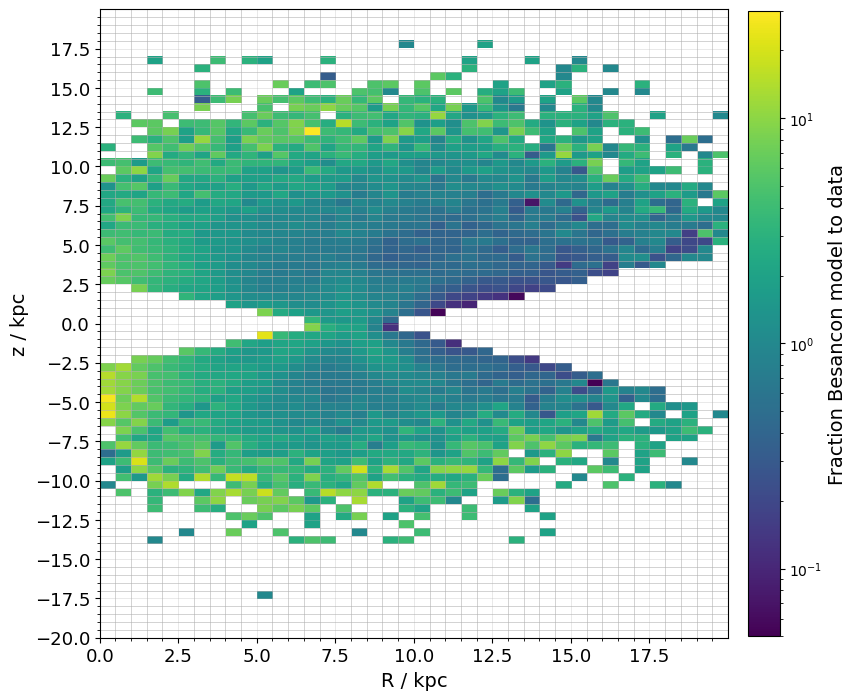

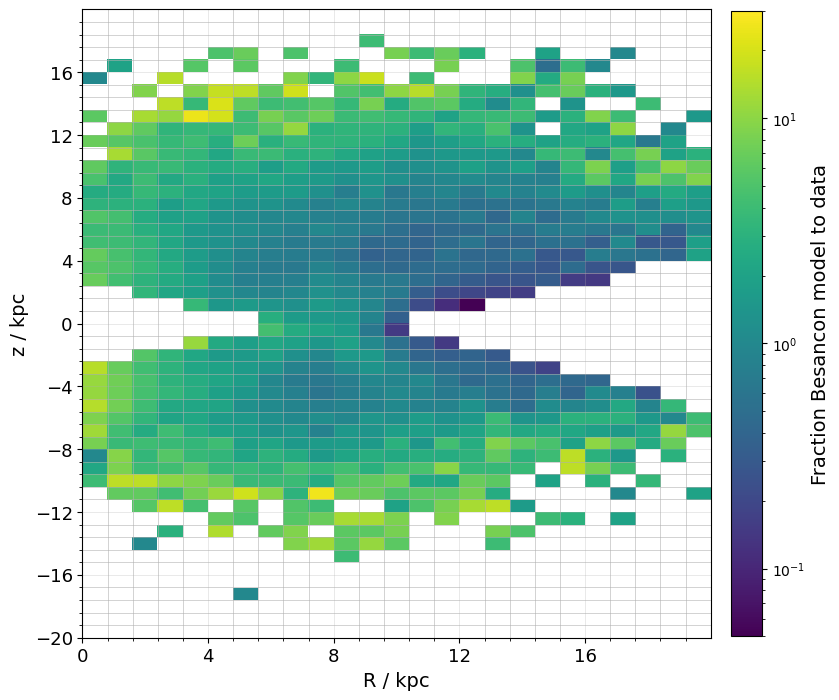

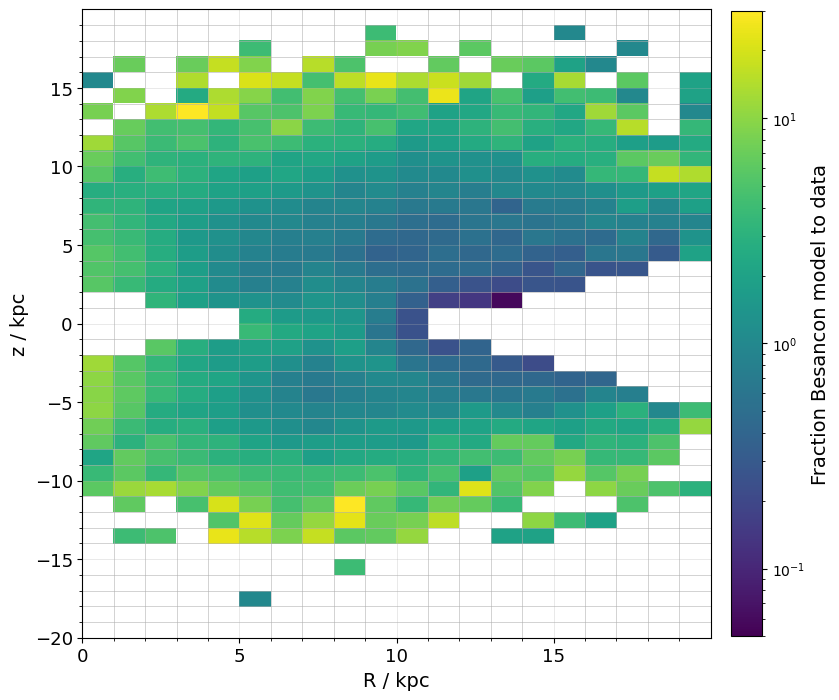

In [23]:
compare(0.5)
compare(0.8)
compare(1.0)

In [24]:
# more detailed
# divide into small cells and compare counts within the cells; set start, stop, cell size
def compare1(cell_size):
    R_start=0
    R_stop=20
    z_start=-20
    z_stop=20
    R_step=np.arange(R_start,R_stop+cell_size,cell_size)
    z_step=np.arange(z_start,z_stop+cell_size,cell_size)

    # count number of objects per cell for data and model
    counts=np.empty(shape=(len(z_step)-1,len(R_step)-1))
    counts_bes=np.empty(shape=(len(z_step)-1,len(R_step)-1))
    for j in range(len(z_step)-1):
        for i in range(len(R_step)-1):
            counts[j][i]=len(R[(fe_h<-1) & (np.array(R)>R_step[int(i)]) & (np.array(R)<R_step[int(i+1)]) & (np.array(z)>z_step[int(j)]) & (np.array(z)<z_step[int(j+1)])])
            counts_bes[j][i]=len(R_bes[(m_h_bes<-1) & (np.array(R_bes)>R_step[int(i)]) & (np.array(R_bes)<R_step[int(i+1)]) & (np.array(z_bes)>z_step[int(j)]) & (np.array(z_bes)<z_step[int(j+1)])])

    frac=counts_bes/counts
    frac[frac==np.inf]=np.nan

    # plot the fractions in the individual cell
    # problem: those cells where data has zero counts remain white
    fig,axs = plt.subplots(nrows=1,ncols=1,figsize=(8.5,7))
    plt.imshow(frac,interpolation='nearest',aspect=1/2,extent=(R_start,R_stop,z_start,z_stop),norm=mplcol.LogNorm(vmin=0.05,vmax=30))
    plt.colorbar(fraction=0.046,pad=0.03).set_label(label='Fraction Besancon model to data',size=14)
    axs.set_xlabel('R / kpc',size=14)
    axs.set_ylabel('z / kpc',size=14)
    axs.set_xticks(np.arange(R_start,R_stop,cell_size*5))
    axs.set_xticks(np.arange(R_start,R_stop,cell_size),minor=True)
    axs.set_yticks(np.arange(z_start,z_stop,cell_size*5))
    axs.set_yticks(np.arange(z_start,z_stop,cell_size),minor=True)
    axs.tick_params(grid_alpha=0.5,labelsize=13)
    axs.grid(which='both',linewidth=0.4)
    plt.subplots_adjust(left=0.11,bottom=0.07,top=0.99,right=0.91)
    plt.savefig('figures/4_13b_fractions_met_min1_cells_'+str(cell_size)+'.png',format='png')

/tmp/ipykernel_7635/1043838096.py:19: RuntimeWarning: divide by zero encountered in true_divide
  frac=counts_bes/counts
/tmp/ipykernel_7635/1043838096.py:19: RuntimeWarning: invalid value encountered in true_divide
  frac=counts_bes/counts


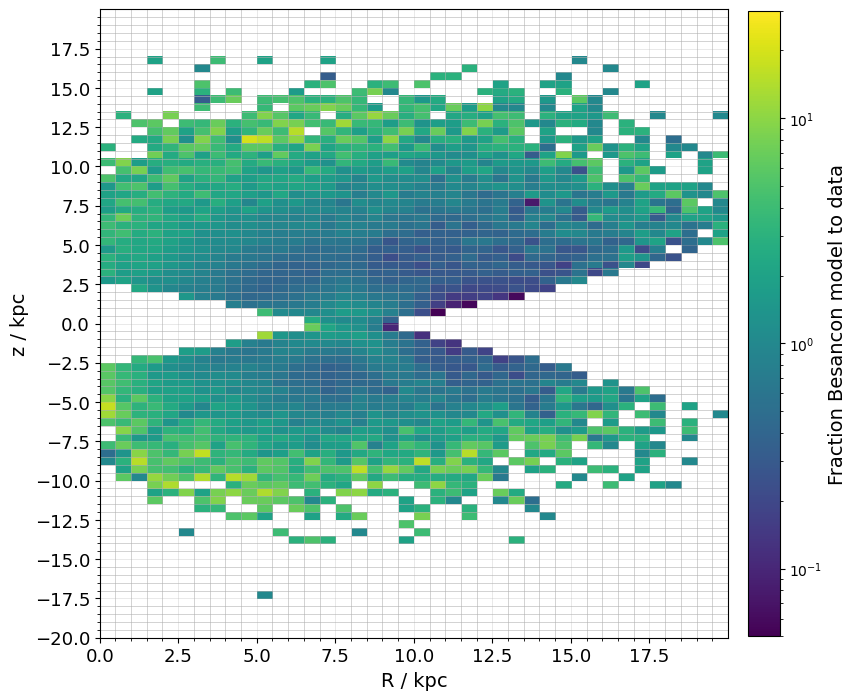

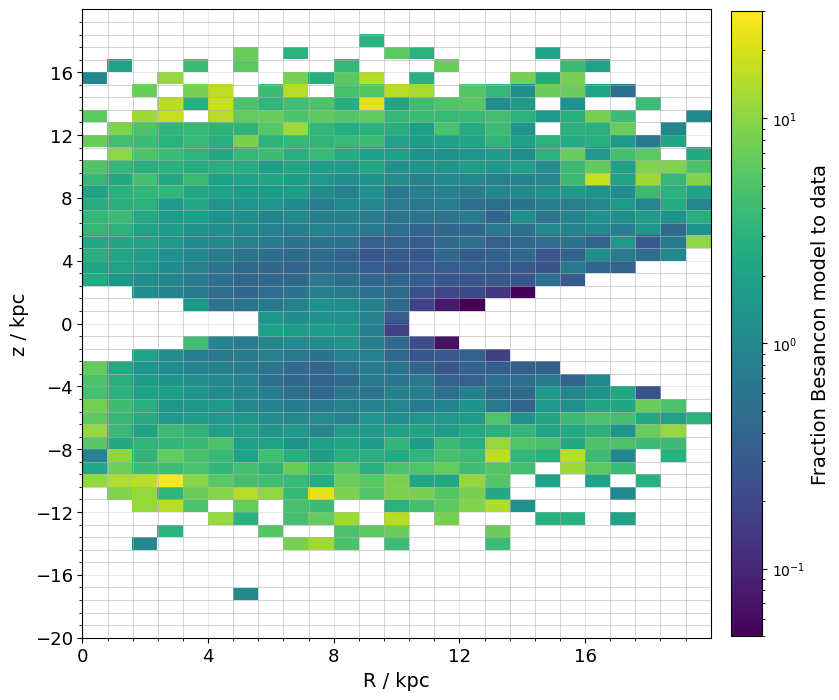

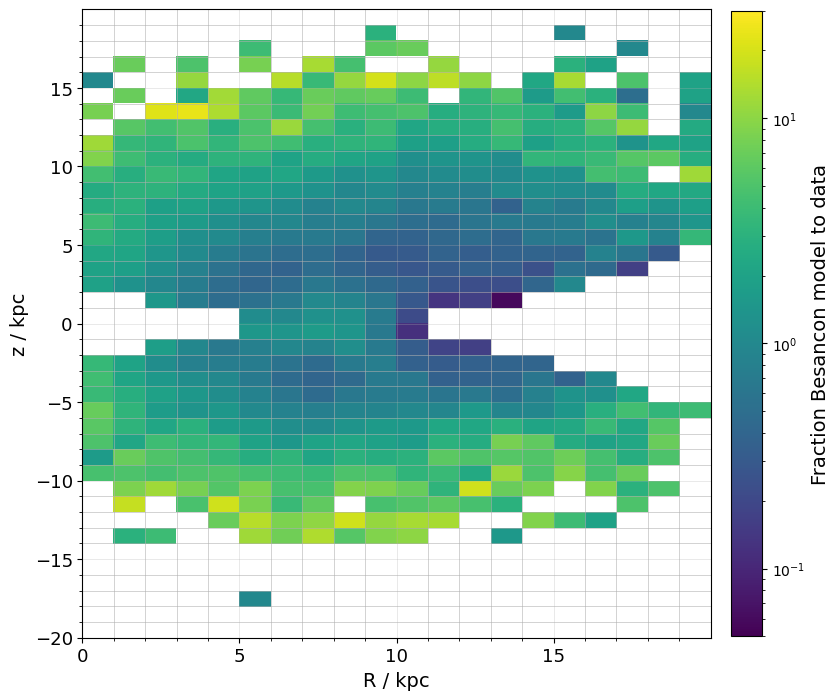

In [25]:
compare1(0.5)
compare1(0.8)
compare1(1.0)